# Clone respository 

In [63]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
!git clone "https://github.com/RuslanZaripov/rhtr.git"

Cloning into 'rhtr'...
remote: Enumerating objects: 743, done.
remote: Counting objects: 100% (230/230), done.
remote: Compressing objects: 100% (170/170), done.
remote: Total 743 (delta 119), reused 153 (delta 55), pack-reused 513
Receiving objects: 100% (743/743), 38.99 MiB | 39.49 MiB/s, done.
Resolving deltas: 100% (462/462), done.


In [3]:
%cd /kaggle/working/rhtr

/kaggle/working/rhtr


In [4]:
!git pull

Already up to date.


In [5]:
import os
workdir = os.getcwd()
workdir 

'/kaggle/working/rhtr'

In [6]:
data_dir = f'{workdir}/data'
data_dir

'/kaggle/working/rhtr/data'

In [7]:
processed_dir = f"{data_dir}/processed"
processed_dir

'/kaggle/working/rhtr/data/processed'

In [8]:
raw_dir = f'{data_dir}/raw'
raw_dir

'/kaggle/working/rhtr/data/raw'

In [9]:
!mkdir {data_dir}
!mkdir {processed_dir}
!mkdir {raw_dir}

# Downloading data

In [10]:
!pip install gdown > /dev/null

In [11]:
!gdown 1GBgRIwXq-Z03wRMv3bLPjZBdQ6OJXFVi -O {processed_dir + '/SchoolSegmentationDatasetEN-watershed.zip'}

Downloading...
From (original): https://drive.google.com/uc?id=1GBgRIwXq-Z03wRMv3bLPjZBdQ6OJXFVi
From (redirected): https://drive.google.com/uc?id=1GBgRIwXq-Z03wRMv3bLPjZBdQ6OJXFVi&confirm=t&uuid=5d65f8f5-a1db-4434-889d-ac9702e71a53
To: /kaggle/working/rhtr/data/processed/SchoolSegmentationDatasetEN-watershed.zip
100%|████████████████████████████████████████| 123M/123M [00:02<00:00, 54.4MB/s]


In [12]:
!gdown 1mhVT67dwmxIi1mI0tG9oqfyHHnAapWUQ -O {processed_dir + '/SchoolSegmentationDatasetRU-watershed.zip'}

Downloading...
From (original): https://drive.google.com/uc?id=1mhVT67dwmxIi1mI0tG9oqfyHHnAapWUQ
From (redirected): https://drive.google.com/uc?id=1mhVT67dwmxIi1mI0tG9oqfyHHnAapWUQ&confirm=t&uuid=bd186255-b769-4a7d-95f5-13875f959526
To: /kaggle/working/rhtr/data/processed/SchoolSegmentationDatasetRU-watershed.zip
100%|██████████████████████████████████████| 6.49G/6.49G [01:18<00:00, 82.6MB/s]


In [13]:
!unzip -o {processed_dir + '/SchoolSegmentationDatasetRU-watershed.zip'} -d '/' > /dev/null

In [14]:
!unzip -o {processed_dir + '/SchoolSegmentationDatasetEN-watershed.zip'} -d '/' > /dev/null

In [15]:
!rm -rf {processed_dir + '/SchoolSegmentationDatasetRU-watershed.zip'}

In [16]:
!rm -rf {processed_dir + '/SchoolSegmentationDatasetEN-watershed.zip'}

# Download Dataset to process

In [17]:
!rm -rf /kaggle/working/school_notebooks_EN
!git lfs install
!git clone https://huggingface.co/datasets/ai-forever/school_notebooks_EN {raw_dir + '/school_notebooks_EN'}

Updated git hooks.
Git LFS initialized.
Cloning into '/kaggle/working/rhtr/data/raw/school_notebooks_EN'...
remote: Enumerating objects: 34, done.
remote: Total 34 (delta 0), reused 0 (delta 0), pack-reused 34 (from 1)
Unpacking objects: 100% (34/34), 3.98 MiB | 5.61 MiB/s, done.


In [18]:
!rm -rf /kaggle/working/school_notebooks_RU
!git lfs install
!git clone https://huggingface.co/datasets/ai-forever/school_notebooks_RU {raw_dir + '/school_notebooks_RU'}

Updated git hooks.
Git LFS initialized.
Cloning into '/kaggle/working/rhtr/data/raw/school_notebooks_RU'...
remote: Enumerating objects: 38, done.
remote: Total 38 (delta 0), reused 0 (delta 0), pack-reused 38 (from 1)
Unpacking objects: 100% (38/38), 5.70 KiB | 729.00 KiB/s, done.
Filtering content: 100% (5/5), 2.84 GiB | 42.35 MiB/s, done.


In [19]:
!unzip -o -q {raw_dir + '/school_notebooks_EN/images.zip'} -d {raw_dir + '/school_notebooks_EN'} > /dev/null

In [20]:
!unzip -o -q {raw_dir + '/school_notebooks_RU/images.zip'} -d {raw_dir + '/school_notebooks_RU'} > /dev/null

In [21]:
!rm -rf {raw_dir + '/school_notebooks_EN/images.zip'}

In [22]:
!rm -rf {raw_dir + '/school_notebooks_RU/images.zip'}

# Creating Datasets

In [23]:
import os

os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ['TORCH_USE_CUDA_DSA'] = "1"

In [24]:
# basic random seed
import os
import random
import numpy as np
import torch

DEFAULT_RANDOM_SEED = 2021


def seedBasic(seed=DEFAULT_RANDOM_SEED):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)


# torch random seed
def seedTorch(seed=DEFAULT_RANDOM_SEED):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


# basic + torch 
def seedEverything(seed=DEFAULT_RANDOM_SEED):
    seedBasic(seed)
    seedTorch(seed)


def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2 ** 32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

In [25]:
def my_seed(my_seed=42):
    seedEverything(my_seed)
    global g
    g = torch.Generator()
    g.manual_seed(my_seed)

In [26]:
my_seed(42)

In [27]:
!pip install pyclipper > /dev/null

In [28]:
!pip install Cython > /dev/null

In [29]:
!pip install imutils > /dev/null

In [30]:
from src.segmentation.config import Config

train_config = Config(f'{workdir}/src/segmentation/configs/train_config.json')
target_h = train_config.get_image('height')
target_w = train_config.get_image('width')
print(f"{target_h=} {target_w=}")
print(train_config.get_masks())

cwd='/kaggle/working/rhtr' config_path='/kaggle/working/rhtr/src/segmentation/configs/train_config.json'
target_h=768 target_w=768
{'binary': [1.0], 'lines': 5, 'border_mask': [0.5], 'watershed': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]}


In [31]:
from src.segmentation.preprocessing import *


def preprocessing(input_image):
    #     gray = grayscale(input_image)
    #     cl = clahe1channel(gray)
    #     g = gaussian(cl)
    b = bilateral(input_image)
    return b

In [32]:
import albumentations as A

ADE_MEAN = np.array([123.675, 116.280, 103.530]) / 255
ADE_STD = np.array([58.395, 57.120, 57.375]) / 255

validation_transform = A.Compose([
    #     A.CLAHE(p=1),
    A.Normalize(),
    A.Resize(width=target_w, height=target_h),
])

train_transform = A.Compose([
    #     A.CLAHE(p=1),
    A.Normalize(),
    A.Resize(width=target_w, height=target_h),
])

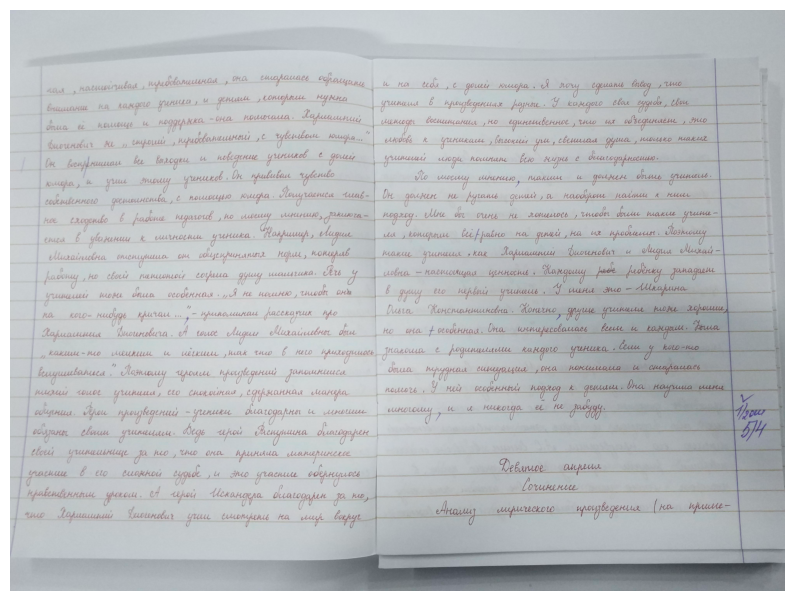

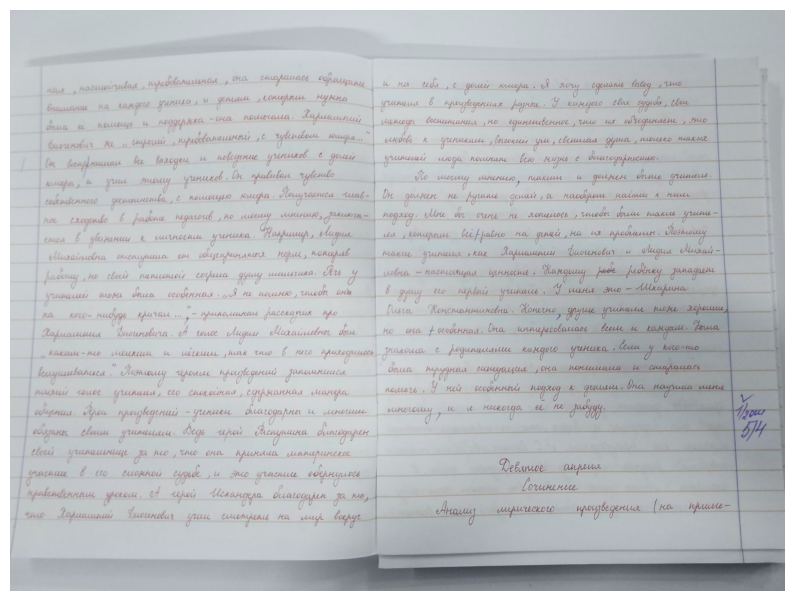

In [33]:
from src.segmentation.utils import visualize

image = cv2.imread(f'{raw_dir}/school_notebooks_RU/images/2914.jpg')
visualize(image)
visualize(preprocessing(image))

In [34]:
from src.segmentation.dataset import SchoolSegmentationDataset

training_set_ru = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_RU/annotations_train.json',
    f'{raw_dir}/school_notebooks_RU/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetRU',
    preprocessing=preprocessing,
    transform=train_transform,

    df_path=f'{processed_dir}/SchoolSegmentationDatasetRU/annotations_train/df_annotations_train.csv', 
#     df_path=None,

    keep=True)

validation_set_ru = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_RU/annotations_val.json',
    f'{raw_dir}/school_notebooks_RU/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetRU',
    preprocessing=preprocessing,
    transform=validation_transform,

    df_path=f'{processed_dir}/SchoolSegmentationDatasetRU/annotations_val/df_annotations_val.csv', 
#     df_path=None,

    keep=True)

multiprocessing.cpu_count()=4


In [35]:
training_set_en = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_EN/annotations_train.json',
    f'{raw_dir}/school_notebooks_EN/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetEN',
    preprocessing=preprocessing,
    transform=train_transform,

    df_path=f'{processed_dir}/SchoolSegmentationDatasetEN/annotations_train/df_annotations_train.csv', 
#     df_path=None,

    keep=True)

validation_set_en = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_EN/annotations_val.json',
    f'{raw_dir}/school_notebooks_EN/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetEN',
    preprocessing=preprocessing,
    transform=validation_transform,

    df_path=f'{processed_dir}/SchoolSegmentationDatasetEN/annotations_val/df_annotations_val.csv', 
#     df_path=None,

    keep=True)

In [36]:
my_seed(42)

In [37]:
from torch.utils.data import ConcatDataset, Subset

training_set = ConcatDataset([training_set_ru, training_set_en])
training_subset_size = len(training_set)
training_subset_indices = torch.randperm(len(training_set))[:training_subset_size]
training_set = Subset(training_set, training_subset_indices)
training_subset_indices[:10]

tensor([1491,  930, 1503,  169, 1075,  202, 1394, 1191,  572,  460])

In [38]:
validation_set = ConcatDataset([validation_set_ru, validation_set_en])
validation_subset_size = len(validation_set)
validation_subset_indices = torch.randperm(len(validation_set))[:validation_subset_size]
validation_set = Subset(validation_set, validation_subset_indices)
validation_subset_indices[:10]

tensor([ 24,  95,  60, 110,  54,   4, 143, 148, 100, 113])

In [39]:
from src.segmentation.dataset import dynamic_length_collate
import torch
import torchvision

# Create data loaders for our datasets; shuffle for training, not for validation
training_loader = torch.utils.data.DataLoader(
    training_set,
    batch_size=4,
    # when train set False
    shuffle=True,  # True 
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

validation_loader = torch.utils.data.DataLoader(
    validation_set,
    batch_size=4,
    shuffle=False,
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

# Report split sizes
print('Training set has {} instances'.format(len(training_loader)))
print('Validation set has {} instances'.format(len(validation_loader)))

Training set has 407 instances
Validation set has 40 instances


In [40]:
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'warn', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

 48%|████▊     | 19/40 [00:18<00:19,  1.06it/s]

type(data[1])=<class 'dict'>
data[1]['watershed'].shape=torch.Size([4, 10, 768, 768])
data[1]['binary'].shape=torch.Size([4, 1, 768, 768])
data[1]['border_mask'].shape=torch.Size([4, 1, 768, 768])

len(word_polygons)=254

data[1].keys()=dict_keys(['binary', 'lines', 'border_mask', 'watershed', 'word_polygons', 'line_polygons'])
background_ratio(borders)=0.7293056911892362
background_ratio(binary)=0.5658671061197916
background_ratio(lines)=0.9812655978732638



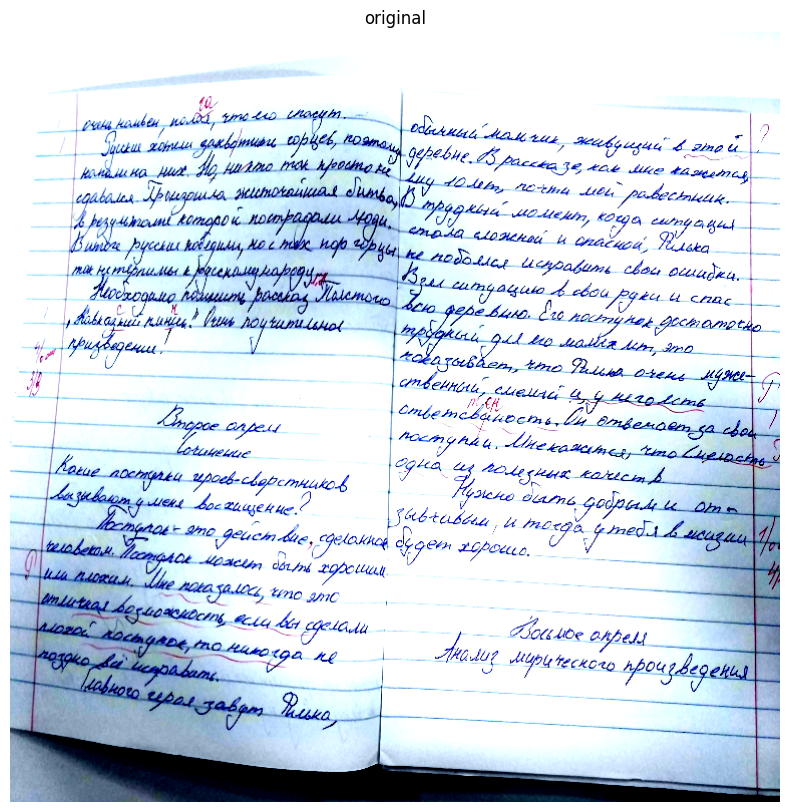

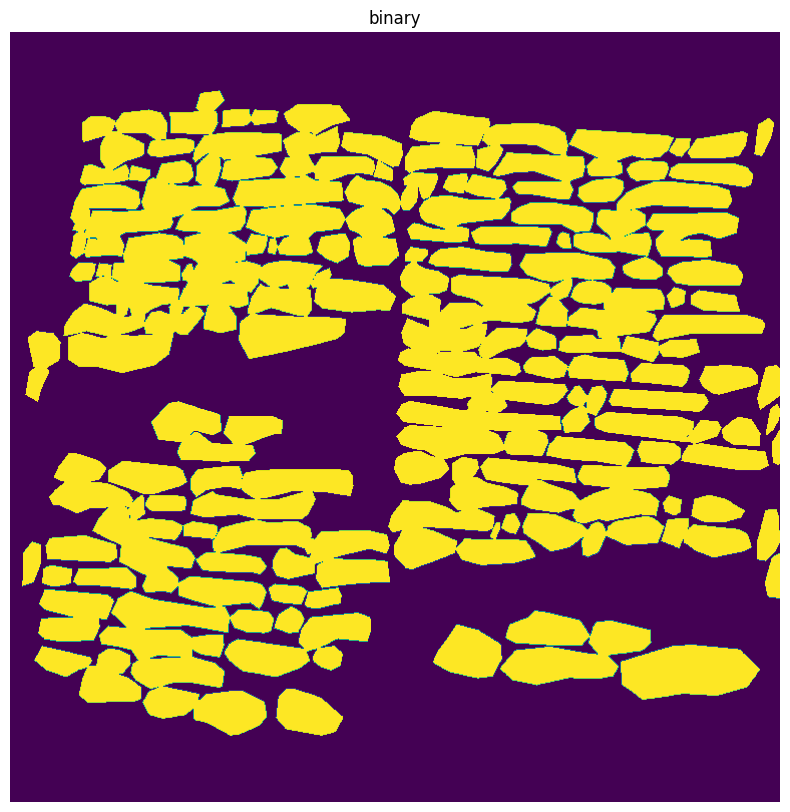

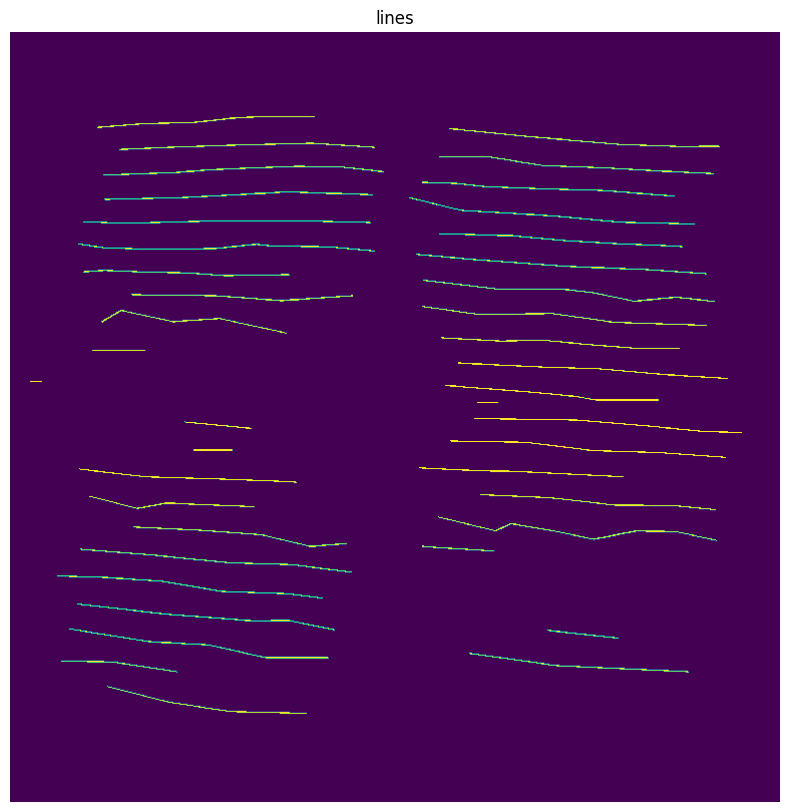

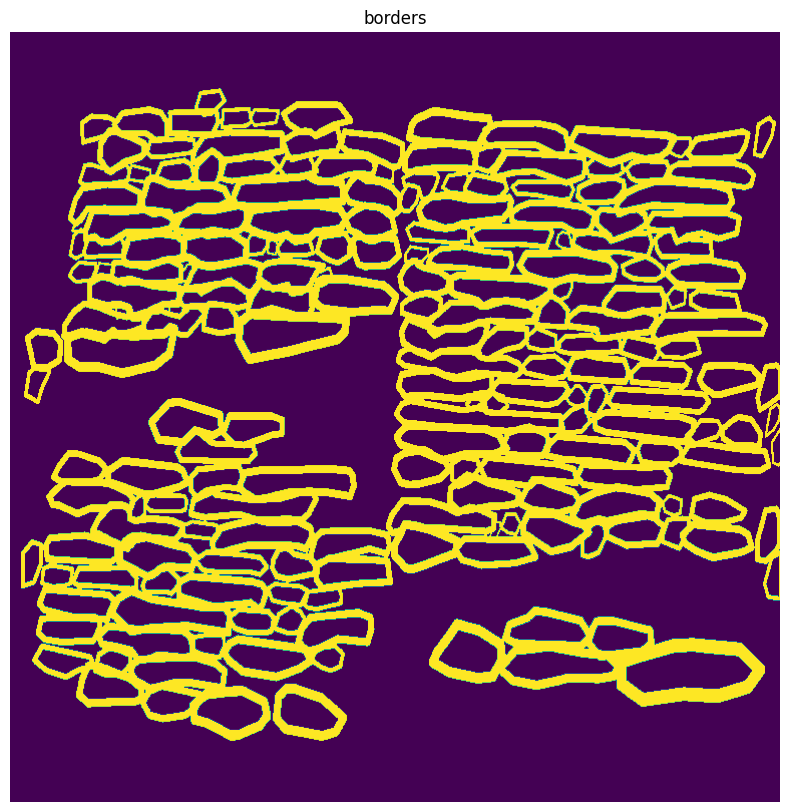

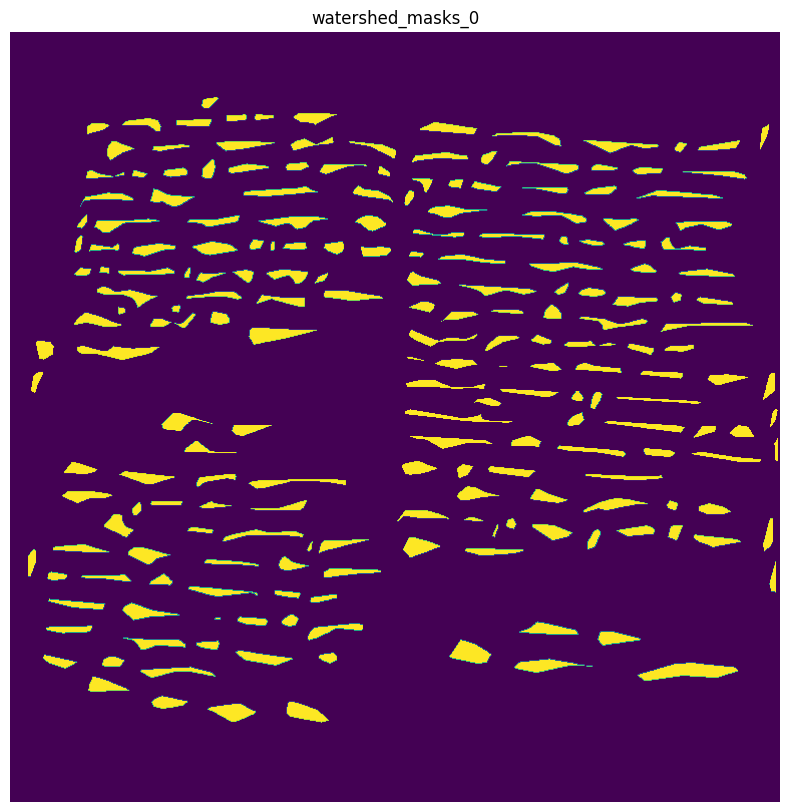

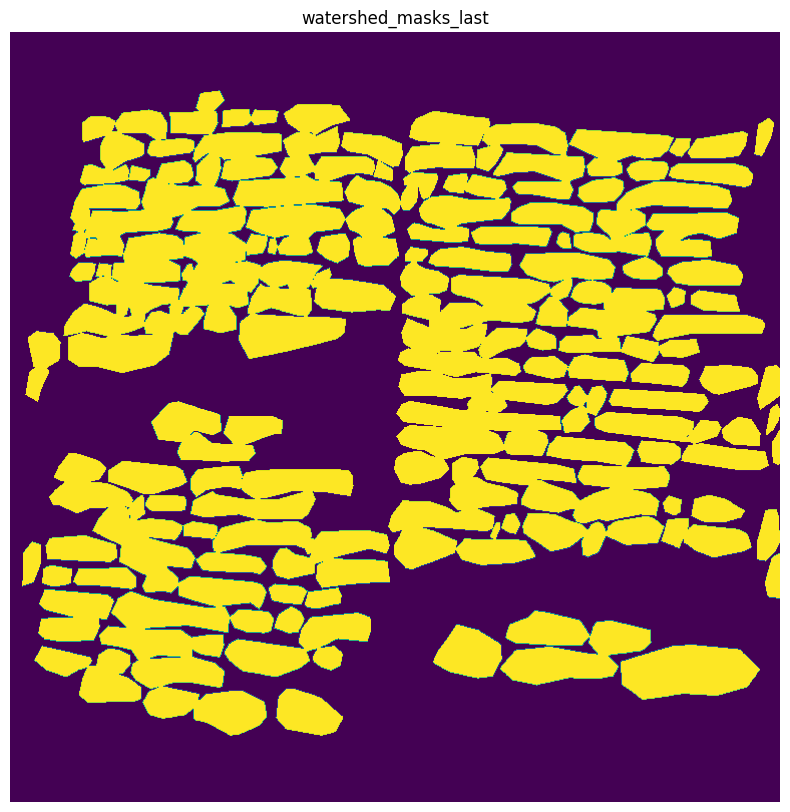

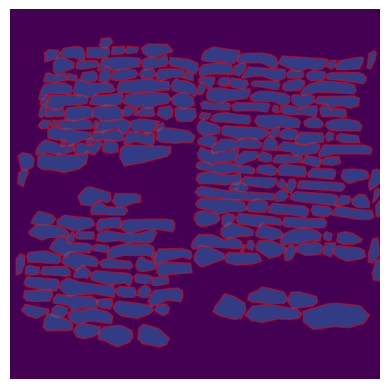

 98%|█████████▊| 39/40 [00:40<00:00,  1.05it/s]

type(data[1])=<class 'dict'>
data[1]['watershed'].shape=torch.Size([4, 10, 768, 768])
data[1]['binary'].shape=torch.Size([4, 1, 768, 768])
data[1]['border_mask'].shape=torch.Size([4, 1, 768, 768])

len(word_polygons)=243

data[1].keys()=dict_keys(['binary', 'lines', 'border_mask', 'watershed', 'word_polygons', 'line_polygons'])
background_ratio(borders)=0.8392062717013888
background_ratio(binary)=0.7719285753038194
background_ratio(lines)=0.9860958523220487



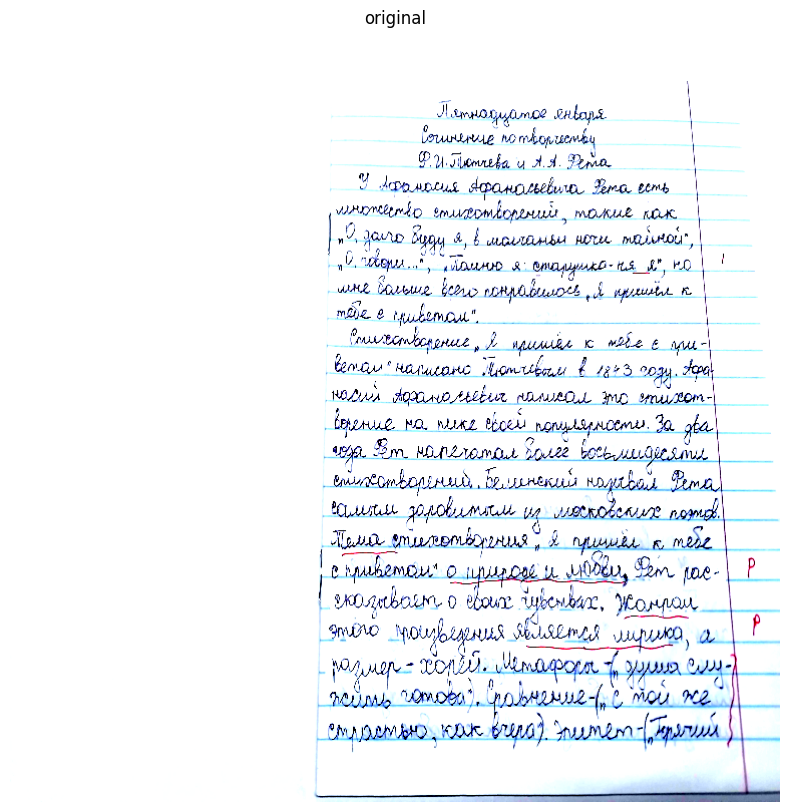

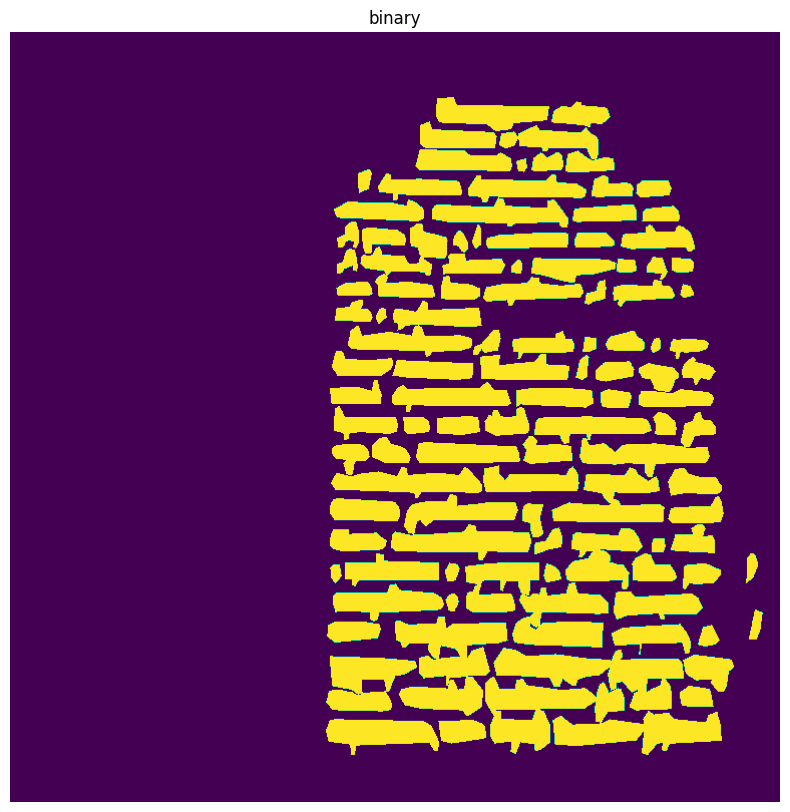

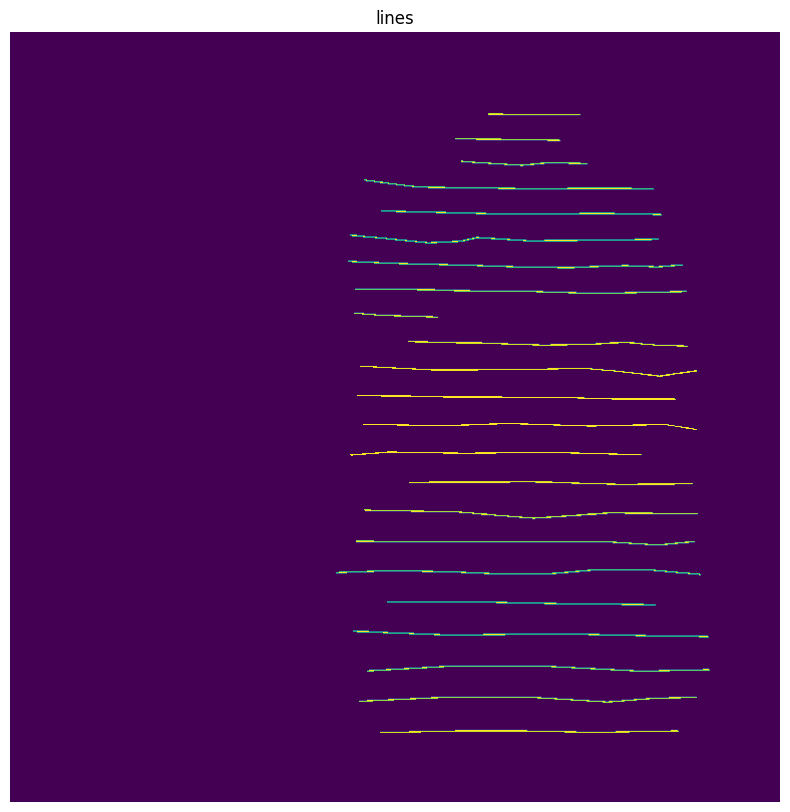

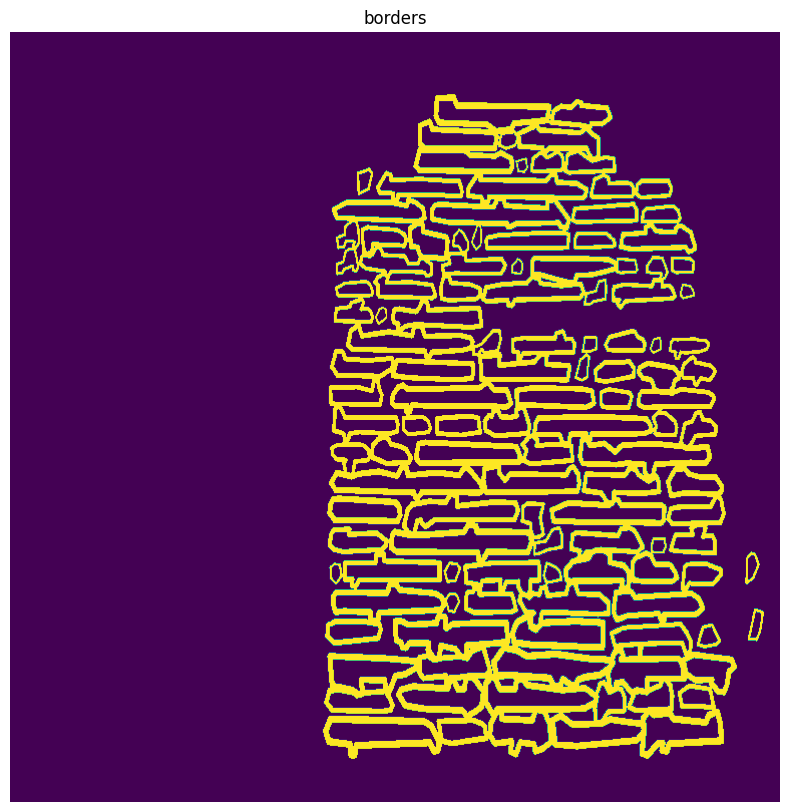

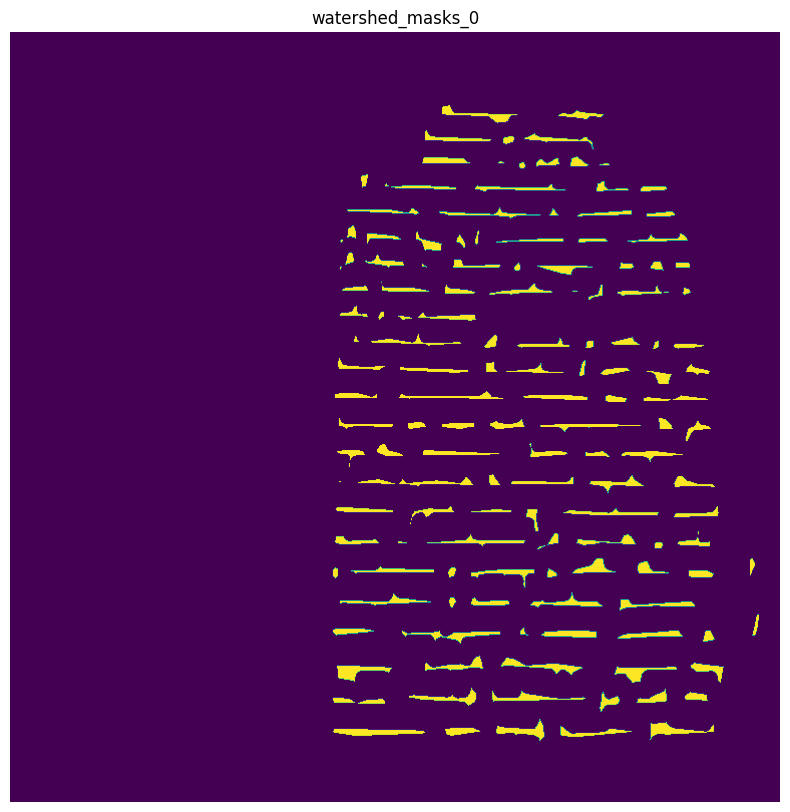

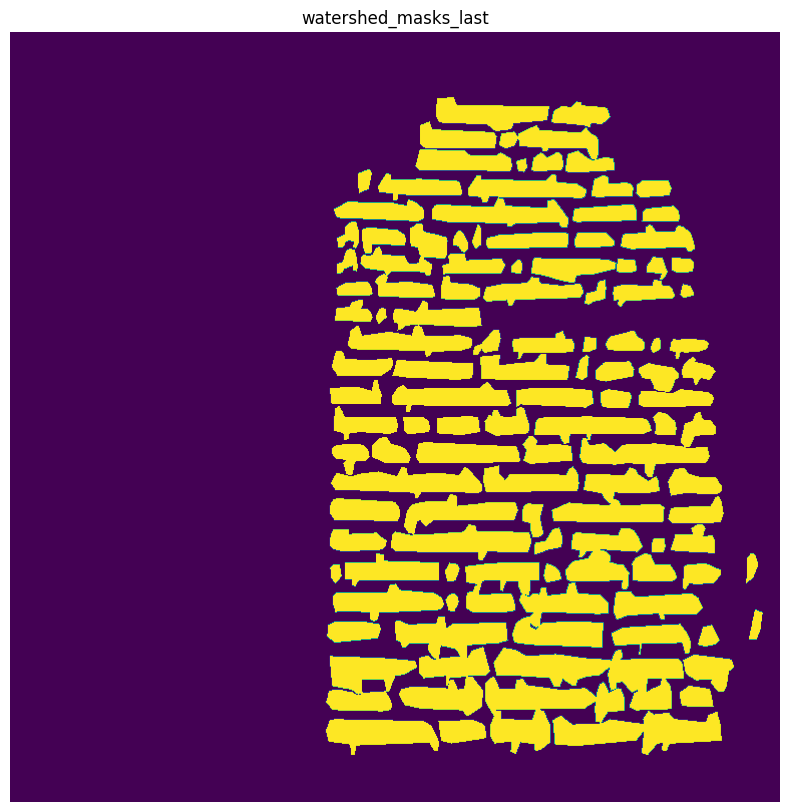

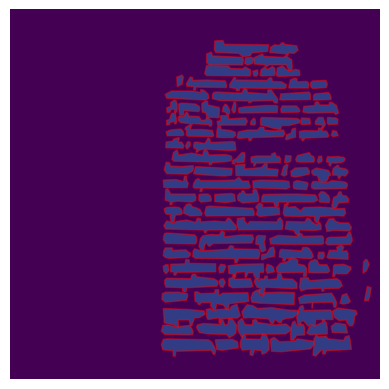

100%|██████████| 40/40 [00:43<00:00,  1.08s/it]

black_pixels_thresh.avg=0.8237815856933594
black_pixels_lines.avg=0.982783847384983
black_pixels_binary.avg=0.7460931989881727



In [41]:
from src.segmentation.metrics import AverageMeter
from src.segmentation.utils import visualize, background_ratio
from tqdm import tqdm

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from shapely.geometry import Polygon

interval = 20
pos_to_show = 0

black_pixels_thresh = AverageMeter('black_pixels_thresh')
black_pixels_binary = AverageMeter('black_pixels_binary')
black_pixels_lines = AverageMeter('black_pixels_lines')

for idx, data in tqdm(enumerate(validation_loader), total=len(validation_loader)):
#     if idx == 1: break
    
#     print(f"{data[0][pos_to_show].shape=}")
#     print(f"{data[0][pos_to_show].min()}-{data[0][pos_to_show].max()}")
    original = np.transpose(data[0][pos_to_show], (1, 2, 0))

    borders = data[1]['border_mask'][0].squeeze(0) # torch.Size([0, 1, H, W])
    watershed_first = data[1]['watershed'][0][0] # torch.Size([0, 0, H, W])
    watershed_last = data[1]['watershed'][0][-1] # torch.Size([0, -1, H, W])

    binary = data[1]['binary'][pos_to_show].squeeze(0) # torch.Size([0, 1, H, W])
    lines = data[1]['lines'][pos_to_show].squeeze(0) # torch.Size([0, 1, H, W])
    
    word_polygons = data[1]['word_polygons'][pos_to_show]

    if idx % interval == (interval - 1):
        print(f"{type(data[1])=}")
        print(f"{data[1]['watershed'].shape=}") # torch.Size([B, C, H, W])
        print(f"{data[1]['binary'].shape=}") # torch.Size([B, C, H, W])
        print(f"{data[1]['border_mask'].shape=}") # torch.Size([B, C, H, W])
        print()
        
        print(f"{len(word_polygons)=}")
        print()
        
        
        print(f"{data[1].keys()=}")

        print(f"{background_ratio(borders)=}")
        print(f"{background_ratio(binary)=}")
        print(f"{background_ratio(lines)=}")
        print()

        visualize(original, 'original', cmap='gray')
        visualize(binary, 'binary')
        visualize(lines, 'lines')
        visualize(borders, 'borders')
        visualize(watershed_first, 'watershed_masks_0')
        visualize(watershed_last, 'watershed_masks_last')
        
        # draw polygons
        image = np.zeros((target_h, target_w), dtype=np.uint8)
        fig, ax = plt.subplots()
        ax.imshow(image)
        for polygon in word_polygons:
            if len(polygon) == 0: continue
            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax.add_patch(poly)
        plt.axis('off')
        plt.show()

    black_pixels_thresh.update(background_ratio(borders))
    black_pixels_binary.update(background_ratio(binary))
    black_pixels_lines.update(background_ratio(lines))

print(f"{black_pixels_thresh.avg=}")
print(f"{black_pixels_lines.avg=}")
print(f"{black_pixels_binary.avg=}")
print()

In [ ]:
training_set_en.save_df()
training_set_ru.save_df()

In [ ]:
validation_set_en.save_df()
validation_set_ru.save_df()

# Download datasets

In [ ]:
!zip -r /kaggle/working/SchoolSegmentationDatasetEN-watershed.zip {processed_dir + '/SchoolSegmentationDatasetEN'} > /dev/null

In [ ]:
!zip -r /kaggle/working/SchoolSegmentationDatasetRU-watershed.zip {processed_dir + '/SchoolSegmentationDatasetRU'} > /dev/null

In [ ]:
%cd /kaggle/working

In [ ]:
from IPython.display import FileLink

FileLink(r'SchoolSegmentationDatasetEN-watershed.zip')

In [ ]:
from IPython.display import FileLink

FileLink(r'SchoolSegmentationDatasetRU-watershed.zip')

In [ ]:
%cd {workdir}

images.shape=torch.Size([4, 3, 768, 768])
targets.shape=torch.Size([4, 1, 768, 768])
torch.Size([3, 772, 3082])


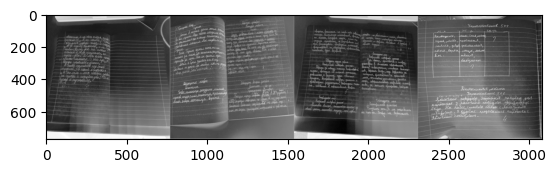

torch.Size([3, 772, 3082])


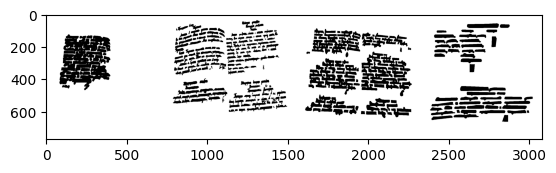

In [42]:
import matplotlib.pyplot as plt
import numpy as np


# Helper function for inline image display
def matplotlib_imshow(img, one_channel=False):
    print(f"{img.shape}")

    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


dataiter = iter(training_loader)
images, targets = next(dataiter)

targets = targets['binary']

print(f"{images.shape=}")
print(f"{targets.shape=}")

images = images.float()
targets = targets.float()

# Create a grid from the images and show them
img_grid = torchvision.utils.make_grid(images)
matplotlib_imshow(img_grid, one_channel=True)

target_grid = torchvision.utils.make_grid(targets)
matplotlib_imshow(target_grid, one_channel=True)

# Model 

In [43]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [44]:
from src.segmentation.losses import DiceFocalLoss

loss_fn = DiceFocalLoss()

In [ ]:
from src.segmentation.models import LinkResNet

model = LinkResNet(train_config, input_channels=3, output_channels=13, pretrained=False).to(device)

In [118]:
from src.segmentation.models import LinkResNet

pretrained_model = LinkResNet(train_config, input_channels=3, output_channels=13, pretrained=False).to(device)
path = '/kaggle/input/backup-experiment-watershed-2/rhtr/experiments/backup-experiment-watershed-2/model_2024-05-21_07-39-05_12'
pretrained_model.load_state_dict(torch.load(path, map_location=device))

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


<All keys matched successfully>

In [51]:
# Optimizers specified in the torch.optim package
optimizer = torch.optim.Adam(model.parameters(), lr=2e-4, weight_decay=1e-5)

x.shape=(10, 10)
c.shape=(10, 10, 3)


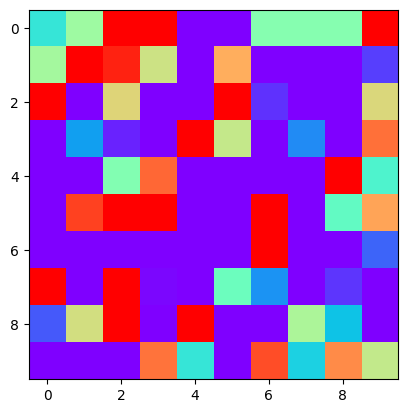

In [52]:
from src.segmentation.utils import colorize
import numpy as np
import matplotlib.pyplot as plt

x = np.random.randn(10, 10).clip(0, 1)
print(f"{x.shape=}")

c = colorize(x)
print(f"{c.shape=}")
plt.imshow(c)
plt.show()

In [53]:
from tqdm import tqdm
from src.segmentation.utils import dict_to

# PyTorch TensorBoard support
from torch.utils.tensorboard import SummaryWriter


def train_one_epoch(epoch_index, tb_writer):
    running_loss = 0.
    last_loss = 0.

    # Here, we use enumerate(training_loader) instead of
    # iter(training_loader) so that we can track the batch
    # index and do some intra-epoch reporting
    for idx, data in tqdm(enumerate(training_loader), total=len(training_loader)):
        # Every data instance is an input + label pair
        inputs, labels = data[0].to(device), dict_to(data[1], device)

        # Zero your gradients for every batch!
        optimizer.zero_grad()

        inputs = inputs.float()
        
        # Make predictions for this batch
        outputs = model(inputs)

        # visualize(np.transpose(inputs[0].data.cpu().numpy(), (1, 2, 0)))
        # visualize(colorize(outputs['binary'][0][0].data.cpu().numpy()))

        # Tensor Board Logging
#         tb_writer.add_image(
#             'Train/input',
#             np.transpose(inputs[0].data.cpu().numpy(), (1, 2, 0)),
#             i, 
#             dataformats='HWC')
#         tb_writer.add_image(
#             'Train/binary_mask',
#             colorize(outputs['binary'][0][0].data.cpu().numpy()),
#             i, 
#             dataformats='HWC')
#         tb_writer.add_image(
#             'Train/thresh_mask',
#             colorize(outputs['thresh'][0][0].data.cpu().numpy()),
#             i,
#             dataformats='HWC')
#         tb_writer.add_image(
#             'Train/thresh_binary_mask',
#             colorize(outputs['thresh_binary'][0][0].data.cpu().numpy()),
#             i, 
#             dataformats='HWC')
#         tb_writer.add_image(
#             'Train/energy',
#             colorize(calculate_energy(outputs['watershed_masks'][0])[1]), 
#             i,
#             dataformats='HWC')

#         visualize(colorize(calculate_energy(outputs['watershed_masks'][0])[1]))

#         tb_writer.add_image(
#             'Train/lines',
#             colorize(outputs['lines'][0][0].data.cpu().numpy()),
#             i,
#             dataformats='HWC')

#         visualize(colorize(outputs['lines'][0][0].data.cpu().numpy()))

        # Compute the loss and its gradients
        tb_x = epoch_index * len(training_loader) + idx + 1
        loss = loss_fn(outputs, labels, 'Train', tb_writer, tb_x)

        #         loss.requires_grad = True
        loss.backward()

        # Adjust learning weights
        optimizer.step()

        # Gather data and report
        running_loss += loss.item()

        track_loss_batch_size = 50
        if idx % track_loss_batch_size == (track_loss_batch_size - 1):
            last_loss = running_loss / track_loss_batch_size  # loss per batch
            print('  batch {} loss: {}'.format(idx + 1, last_loss))
            tb_writer.add_scalar('Loss/train', last_loss, tb_x)
            running_loss = 0.

    return last_loss

2024-05-21 07:38:45.950415: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-21 07:38:45.950539: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-21 07:38:46.095093: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [54]:
!rm -rf {workdir + '/weights'}

In [55]:
import os

os.makedirs(f'{workdir}/weights', exist_ok=True)

In [56]:
!ls -la {workdir + '/weights'}

total 8
drwxr-xr-x 2 root root 4096 May 21 07:38 .
drwxr-xr-x 9 root root 4096 May 21 07:38 ..


In [57]:
!rm -rf {workdir + '/runs'}

In [58]:
import pandas as pd

evaluation_metrics = pd.DataFrame(columns=['Epoch', 'Val/IOU', 'Val/F1', 'Val/Accuracy', 'Val/Precision', 'Val/Recall'])

In [59]:
from src.segmentation.metrics import batch_mean, accuracy, precision, recall, f1_score, iou_pytorch
import torch
import numpy as np

preds = [torch.tensor(np.array([[0, 1], [0, 0]]))]
targets = [torch.tensor(np.array([[0, 1], [1, 0]]))]

acc = batch_mean(preds, targets, accuracy)
p = batch_mean(preds, targets, precision)
r = batch_mean(preds, targets, recall)
f1 = batch_mean(preds, targets, f1_score)
iou = batch_mean(preds, targets, iou_pytorch)
print(f"{acc=} {p=} {r=} {f1=} {iou=}")

acc=0.75 p=0.9999998807907104 r=0.5 f1=0.666666567325592 iou=0.5


In [60]:
from src.segmentation.metrics import calc_mAPIoU

calc_mAPIoU(
    preds=[[
        [[2, 1], [2, 3], [4, 3], [4, 1]],
        [[2, 1], [2, 3], [4, 3], [4, 1]],
        [[1, 1], [1, 3], [2, 3], [2, 2], [3, 2], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[1, 1], [1, 3], [3, 3], [3, 1]]
    ]],
    targets=[[
        [],
        [[1, 1], [1, 3], [3, 3], [3, 1]],
        [[0, 0], [0, 1], [1, 1], [1, 0]],
        [],
        [],
        [[8, 0], [8, 1], [9, 1], [9, 0]]
    ]],
    upscale_ratio=1.0)

Execution time of calc_mAPIoU: 4.318863153457642 seconds


(0.125, 0.16666666666666666, 0.3333333333333333, 0.2222221777777867)

In [61]:
from datetime import datetime

timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
writer = SummaryWriter(f'{workdir}/runs/school_notebooks_trainer_{timestamp}')
epoch_number = 0
EPOCHS = 15
best_vloss = 1000000

EPOCH 14:


 12%|█▏        | 50/407 [02:01<14:30,  2.44s/it]

  batch 50 loss: 0.12312309233836816


 25%|██▍       | 100/407 [04:04<12:33,  2.45s/it]

  batch 100 loss: 0.12150797482977854


 37%|███▋      | 150/407 [06:05<10:26,  2.44s/it]

  batch 150 loss: 0.1230710038009634


 49%|████▉     | 200/407 [08:08<08:44,  2.53s/it]

  batch 200 loss: 0.12761647327902387


 61%|██████▏   | 250/407 [10:11<06:24,  2.45s/it]

  batch 250 loss: 0.12404496787833123


 74%|███████▎  | 300/407 [12:13<04:21,  2.44s/it]

  batch 300 loss: 0.12346394042334968


 86%|████████▌ | 350/407 [14:15<02:19,  2.45s/it]

  batch 350 loss: 0.12652831352427296


 98%|█████████▊| 400/407 [16:18<00:17,  2.47s/it]

  batch 400 loss: 0.12187316020262912


  2%|▎         | 1/40 [00:01<01:04,  1.65s/it]

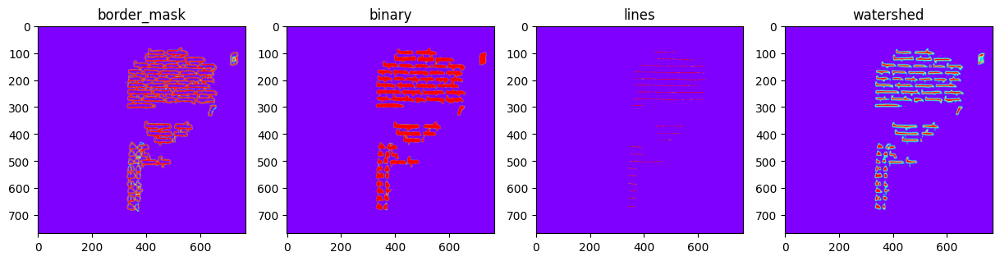

100%|██████████| 40/40 [01:03<00:00,  1.60s/it]



Loss: 0.137 | IoU: 0.628 | Acc: 0.969 | Precision: 0.742 | Recall: 0.775 | F1: 0.752
EPOCH 15:


  0%|          | 1/407 [00:04<29:28,  4.36s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 576.00 MiB. GPU 0 has a total capacty of 14.75 GiB of which 359.06 MiB is free. Process 2381 has 14.39 GiB memory in use. Of the allocated memory 12.70 GiB is allocated by PyTorch, and 1.55 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

In [159]:
from src.segmentation.metrics import MetricMonitor
from src.segmentation.predictor import calculate_energy

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch_number + 1))

    # Make sure gradient tracking is on, and do a pass over the data
    model.train(True)
    avg_loss = train_one_epoch(epoch_number, writer)

    # Set the model to evaluation mode, disabling dropout and using population
    # statistics for batch normalization.
    model.eval()

    loader_len = len(validation_loader)
    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        
        metric_monitor = MetricMonitor()
        
        for i, vdata in tqdm(enumerate(validation_loader), total=loader_len):
            vinputs, vlabels = vdata[0].to(device), dict_to(vdata[1], device)

            vinputs = vinputs.float()
            voutputs = model(vinputs)

            if i == 1:
                fig = plt.figure(figsize=(15, 60))
                
                ax1 = fig.add_subplot(1, 4, 1)
                ax1.set_title('border_mask')
                ax1.imshow(colorize(voutputs['border_mask'][0].data.cpu().numpy()[0]))
                
                ax2 = fig.add_subplot(1, 4, 2)
                ax2.set_title('binary')
                ax2.imshow(colorize(voutputs['binary'][0].data.cpu().numpy()[0]))
                
                ax3 = fig.add_subplot(1, 4, 3)
                ax3.set_title('lines')
                ax3.imshow(colorize(voutputs['lines'][0].data.cpu().numpy()[0]))
                
                ax4 = fig.add_subplot(1, 4, 4)
                ax4.set_title('watershed')
                ax4.imshow(colorize(calculate_energy(voutputs['watershed'][0])[1]))
                
                plt.show()

            vloss = loss_fn(voutputs, vlabels)

            metric_monitor.update('Loss', vloss)

            binary_iou = batch_mean(voutputs['binary'], vlabels['binary'], iou_pytorch)
            binary_f1_score = batch_mean(voutputs['binary'], vlabels['binary'], f1_score)
            binary_acc = batch_mean(voutputs['binary'], vlabels['binary'], accuracy)
            binary_p = batch_mean(voutputs['binary'], vlabels['binary'], precision)
            binary_r = batch_mean(voutputs['binary'], vlabels['binary'], recall)

            lines_iou = batch_mean(voutputs['lines'], vlabels['lines'], iou_pytorch)
            lines_f1_score = batch_mean(voutputs['lines'], vlabels['lines'], f1_score)
            lines_acc = batch_mean(voutputs['lines'], vlabels['lines'], accuracy)
            lines_p = batch_mean(voutputs['lines'], vlabels['lines'], precision)
            lines_r = batch_mean(voutputs['lines'], vlabels['lines'], recall)

            iou = (binary_iou + lines_iou) / 2
            f1 = (binary_f1_score + lines_f1_score) / 2
            acc = (binary_acc + lines_acc) / 2
            r = (binary_r + lines_r) / 2
            p = (binary_p + lines_p) / 2
            
            metric_monitor.update('IoU', iou)
            metric_monitor.update('Acc', acc)
            metric_monitor.update('Precision', p)
            metric_monitor.update('Recall', r)
            metric_monitor.update('F1', f1)

    print(f"\n{metric_monitor}")
    
    avg_vloss = metric_monitor.get('Loss')

    # Log the running loss averaged per batch
    # for both training and validation
    writer.add_scalars('Training vs. Validation Loss',
                       {'Training': avg_loss, 'Validation': avg_vloss},
                       epoch_number + 1)
    writer.flush()

    metrics = {
        'Epoch': epoch_number + 1,
        'Val/IOU': metric_monitor.get('IoU'),
        'Val/F1': metric_monitor.get('F1'),
        'Val/Accuracy': metric_monitor.get('Acc'),
        'Val/Precision': metric_monitor.get('Precision'),
        'Val/Recall': metric_monitor.get('Recall'),

    }
    evaluation_metrics = pd.concat(
        [evaluation_metrics, pd.DataFrame([metrics])],
        ignore_index=True)

    # Track best performance, and save the model's state
    if avg_vloss < best_vloss:
        best_vloss = avg_vloss
        model_path = f'{workdir}/weights/model_{timestamp}_{epoch_number}'
        torch.save(model.state_dict(), model_path)

    epoch_number += 1

In [65]:
evaluation_metrics.head(3)

,Epoch,Val/IOU,Val/F1,Val/Accuracy,Val/Precision,Val/Recall
0,1,0.627976,0.753160,0.968084,0.733279,0.791114
1,2,0.623948,0.749744,0.967652,0.723049,0.805448
2,3,0.619097,0.742946,0.968675,0.723036,0.774788


In [66]:
name = 'backup-experiment-watershed-2'
path = f'/{workdir}/experiments/{name}'

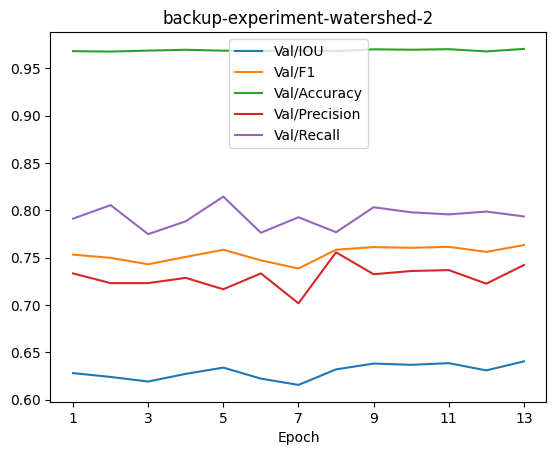

In [67]:
df_plot = evaluation_metrics.set_index('Epoch')
columns_to_divide = df_plot.columns[df_plot.columns != 'Epoch']
df_plot[columns_to_divide] = df_plot[columns_to_divide]
df_plot.plot(title=name)
df_plot = df_plot.reset_index()

# Saving 

In [68]:
import os

os.makedirs(path, exist_ok=True)

In [69]:
!ls -la {path}

total 8
drwxr-xr-x 2 root root 4096 May 21 11:50 .
drwxr-xr-x 3 root root 4096 May 21 11:50 ..


In [70]:
evaluation_metrics.to_csv(f'{path}/evaluation_metrics.csv')

In [71]:
print(f'{epoch_number=}')
print(f'{best_vloss.item()=}')
print(f'{validation_transform=}')
print(f'{train_transform=}')

epoch_number=13
best_vloss.item()=0.13121942411996965
validation_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)
train_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)


In [72]:
# Specify the file path where you want to create the file
file_path = f'{path}/parameters.txt'

# Content to write to the file as a multi-line string
content = """
epoch_number=13
best_vloss.item()=0.13121942411996965
validation_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)
train_transform=Compose([
  Normalize(always_apply=False, p=1.0, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0),
  Resize(always_apply=False, p=1, height=768, width=768, interpolation=1),
], p=1.0, bbox_params=None, keypoint_params=None, additional_targets={}, is_check_shapes=True)

Bilateral + Z-score
"""

# Open the file in write mode ('w')
with open(file_path, 'w') as file:
    # Write the multi-line content to the file
    file.write(content)

In [73]:
dirname = str(os.listdir(f'{workdir}/runs')[-1])
print(f"{dirname=}")
source_dir = f'{workdir}/runs/{dirname}'
destination_dir = f'{path}/{dirname}'

from distutils.dir_util import copy_tree
copy_tree(source_dir, destination_dir)

dirname='school_notebooks_trainer_2024-05-21_07-39-05'


['//kaggle/working/rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/Training vs. Validation Loss_Training/events.out.tfevents.1716278647.5b020862fda3.34.1',
 '//kaggle/working/rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/events.out.tfevents.1716277145.5b020862fda3.34.0',
 '//kaggle/working/rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/Training vs. Validation Loss_Validation/events.out.tfevents.1716278647.5b020862fda3.34.2']

In [79]:
modelname = 'model_2024-05-21_07-39-05_0'
print(f'{dirname=}')
source_dir = f'{workdir}/weights/{modelname}'
destination_dir = f'{path}'

import shutil
shutil.copy2(source_dir, destination_dir)

dirname='school_notebooks_trainer_2024-05-21_07-39-05'


'//kaggle/working/rhtr/experiments/backup-experiment-watershed-2/model_2024-05-21_07-39-05_0'

In [77]:
model_path = f'{path}/model_{timestamp}_last'
torch.save(model.state_dict(), model_path)

In [80]:
from pathlib import Path
parentdir = Path(workdir).parent.absolute()

In [81]:
filename = f'{parentdir}/{name}.zip'
filename

'/kaggle/working/backup-experiment-watershed-2.zip'

In [82]:
!zip -r {filename} {path}

  adding: rhtr/experiments/backup-experiment-watershed-2/ (stored 0%)
  adding: rhtr/experiments/backup-experiment-watershed-2/model_2024-05-21_07-39-05_last (deflated 25%)
  adding: rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/ (stored 0%)
  adding: rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/Training vs. Validation Loss_Training/ (stored 0%)
  adding: rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/Training vs. Validation Loss_Training/events.out.tfevents.1716278647.5b020862fda3.34.1 (deflated 58%)
  adding: rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/events.out.tfevents.1716277145.5b020862fda3.34.0 (deflated 62%)
  adding: rhtr/experiments/backup-experiment-watershed-2/school_notebooks_trainer_2024-05-21_07-39-05/Training vs. Validation Loss_Validation/ (stored 0%)
  adding: rhtr/experiments/backup-

In [83]:
!ls -la {parentdir}

total 552200
drwxr-xr-x  4 root root      4096 May 21 12:07 .
drwxr-xr-x  5 root root      4096 May 21 07:23 ..
drwxr-xr-x  2 root root      4096 May 21 07:23 .virtual_documents
-rw-r--r--  1 root root 565429553 May 21 12:07 backup-experiment-watershed-2.zip
drwxr-xr-x 11 root root      4096 May 21 11:50 rhtr


In [84]:
%cd {parentdir}

/kaggle/working


In [85]:
from IPython.display import FileLink

FileLink(f'{name}.zip')

/kaggle/working/backup-experiment-watershed-2.zip

In [86]:
%cd {workdir}

/kaggle/working/rhtr


In [89]:
from src.segmentation.dataset import SchoolSegmentationDataset

testing_set_en = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_EN/annotations_test.json',
    f'{raw_dir}/school_notebooks_EN/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetEN',
    transform=validation_transform,
    preprocessing=preprocessing,

#     df_path=f'{processed_dir}/SchoolSegmentationDatasetEN/annotations_test/df_annotations_test.csv', 
    df_path=None,

    keep=True)

testing_set_ru = SchoolSegmentationDataset(
    train_config,
    f'{raw_dir}/school_notebooks_RU/annotations_test.json',
    f'{raw_dir}/school_notebooks_RU/images',
    save_dir_path=f'{processed_dir}/SchoolSegmentationDatasetRU',
    transform=validation_transform,
    preprocessing=preprocessing,

#     df_path=f'{processed_dir}/SchoolSegmentationDatasetRU/annotations_test/df_annotations_test.csv', 
    df_path=None,

    keep=True)

In [90]:
my_seed(42)

In [91]:
from torch.utils.data import ConcatDataset, Subset

testing_set = ConcatDataset([testing_set_en, testing_set_ru])
testing_subset_size = len(testing_set)
testing_subset_indices = torch.randperm(len(testing_set))[:testing_subset_size]
testing_set = Subset(testing_set, testing_subset_indices)
testing_subset_indices[:10]

tensor([102,  24, 132,   7,  34,  85, 130, 120,  70,  82])

In [92]:
from src.segmentation.dataset import dynamic_length_collate

testing_loader = torch.utils.data.DataLoader(
    testing_set,
    batch_size=4,
    shuffle=False,
    collate_fn=dynamic_length_collate,
    worker_init_fn=seed_worker,
    generator=g)

In [93]:
from tqdm import tqdm

for idx, data in tqdm(enumerate(testing_loader), total=len(testing_loader)):
    if idx == 1: print("Prepare and save testing data")

  5%|▌         | 2/40 [01:10<23:55, 37.76s/it]

Prepare and save testing data


100%|██████████| 40/40 [21:35<00:00, 32.40s/it]


In [94]:
upscale_ratio = 1.2

  0%|          | 0/40 [00:00<?, ?it/s]

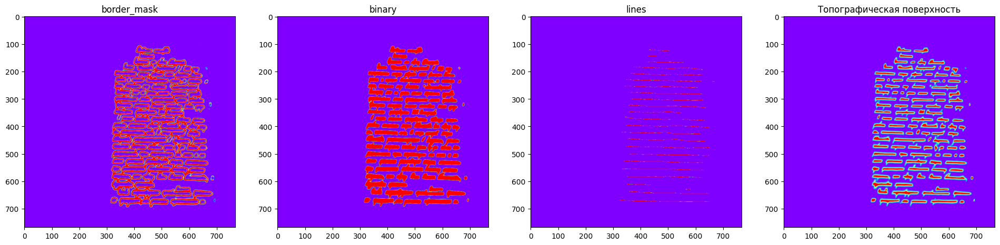

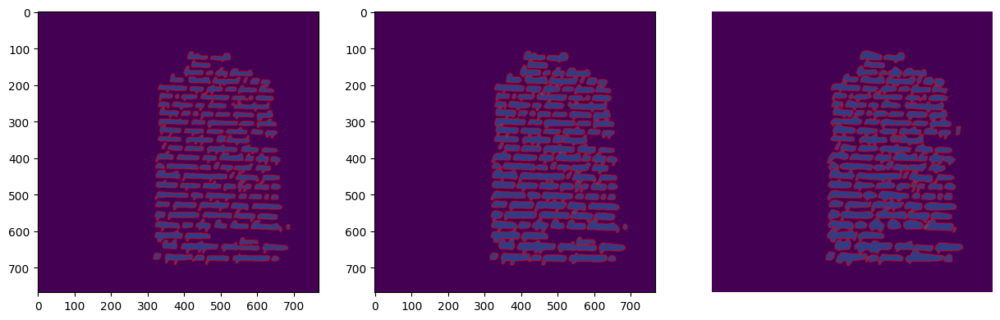

  2%|▎         | 1/40 [00:15<10:02, 15.46s/it]

Execution time of calc_mAPIoU: 7.539124488830566 seconds
tpmAPIoU_05=0.8386096903729416


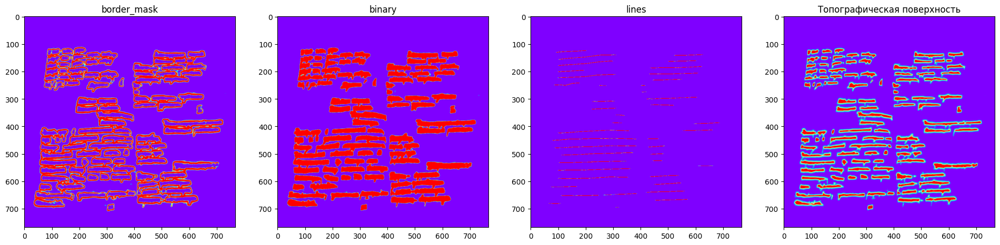

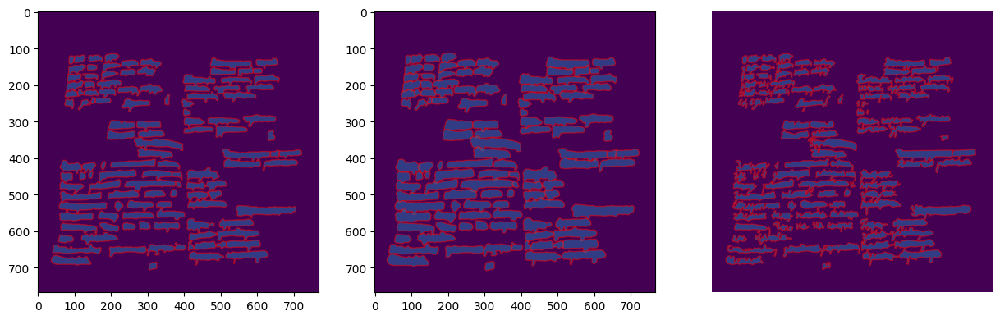

  5%|▌         | 2/40 [00:45<15:09, 23.93s/it]

Execution time of calc_mAPIoU: 11.512197494506836 seconds
tpmAPIoU_05=0.7622877468133266


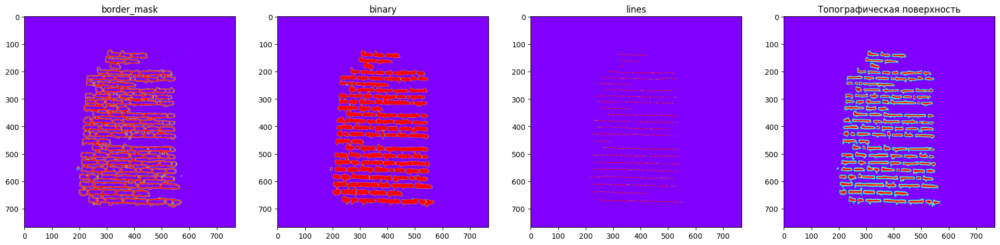

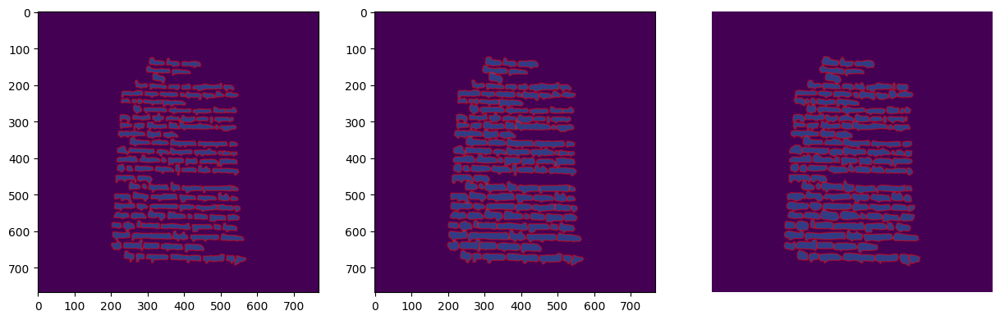

  8%|▊         | 3/40 [00:57<11:20, 18.39s/it]

Execution time of calc_mAPIoU: 3.8504254817962646 seconds
tpmAPIoU_05=0.8316640712923664


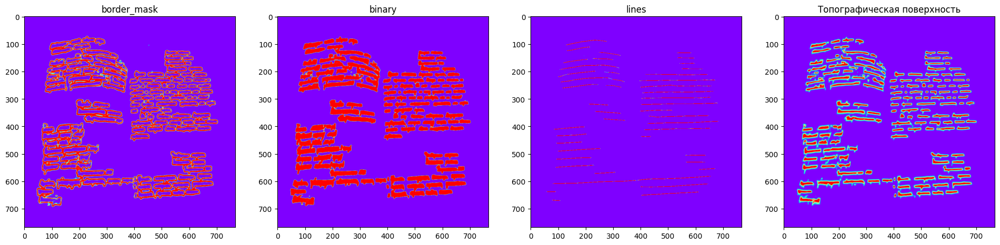

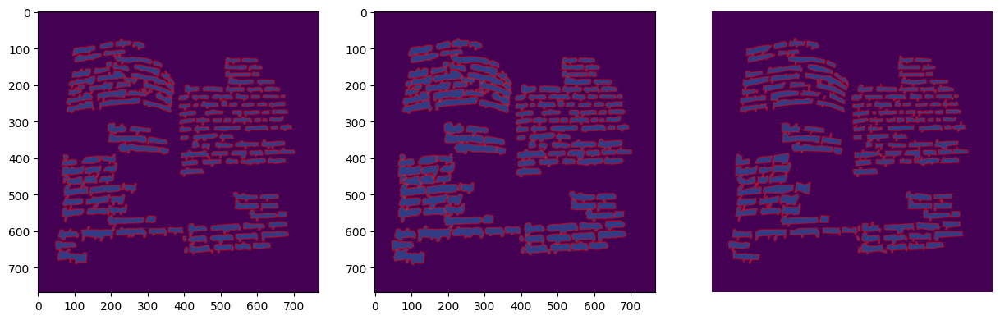

 10%|█         | 4/40 [01:09<09:39, 16.09s/it]

Execution time of calc_mAPIoU: 4.323129415512085 seconds
tpmAPIoU_05=0.8439317645219502


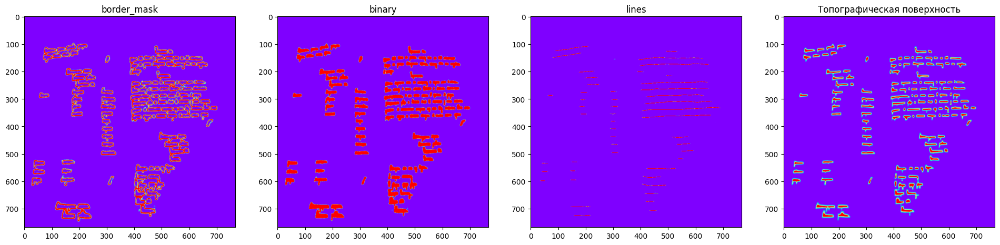

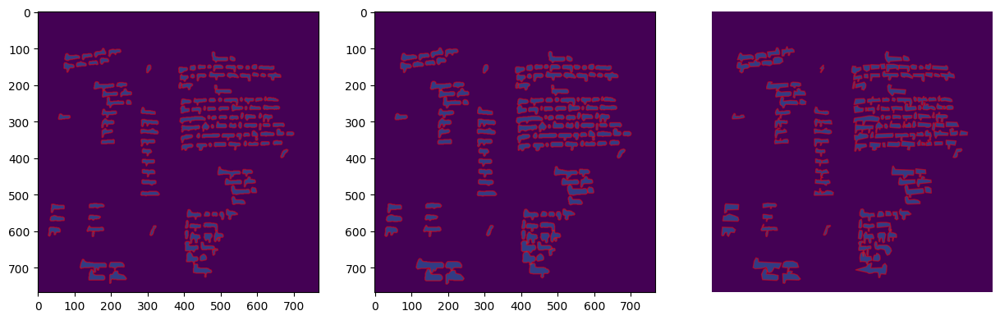

 12%|█▎        | 5/40 [01:23<08:54, 15.26s/it]

Execution time of calc_mAPIoU: 4.450008392333984 seconds
tpmAPIoU_05=0.8750327919248638


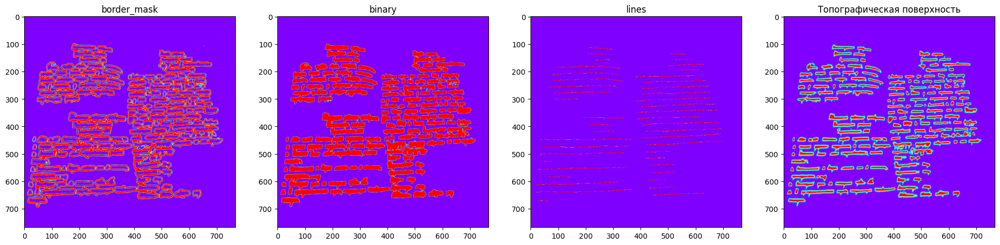

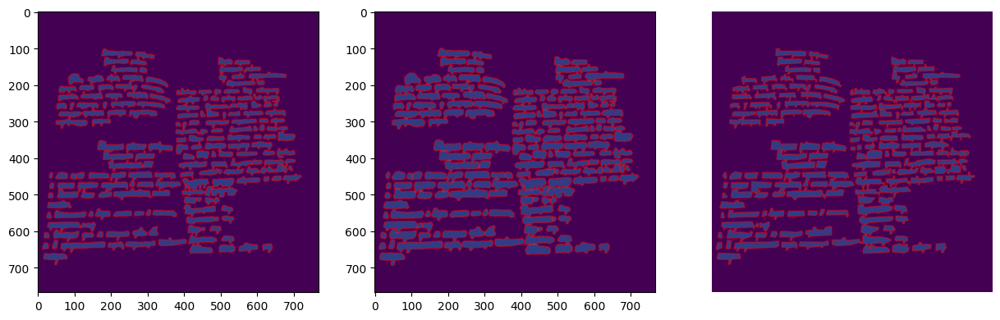

 15%|█▌        | 6/40 [01:45<09:52, 17.43s/it]

Execution time of calc_mAPIoU: 8.535352945327759 seconds
tpmAPIoU_05=0.7659488331552345


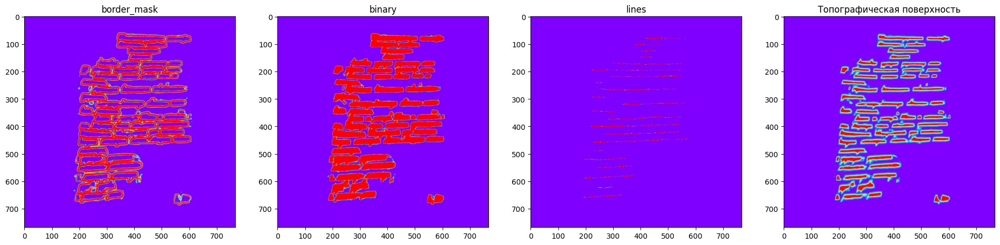

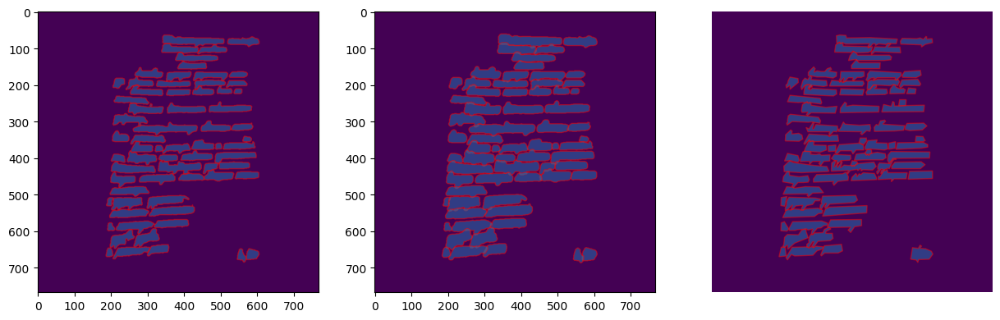

 18%|█▊        | 7/40 [01:59<09:05, 16.52s/it]

Execution time of calc_mAPIoU: 5.384589195251465 seconds
tpmAPIoU_05=0.8287196382910526


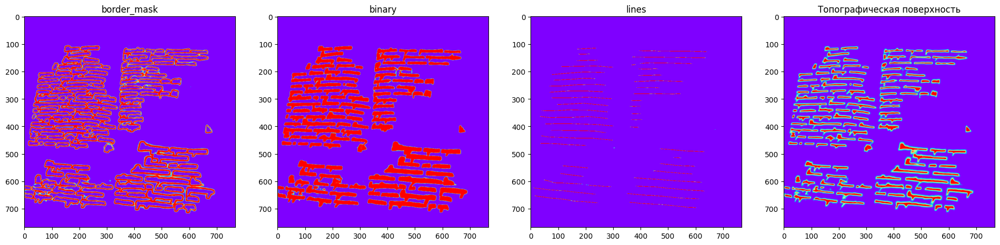

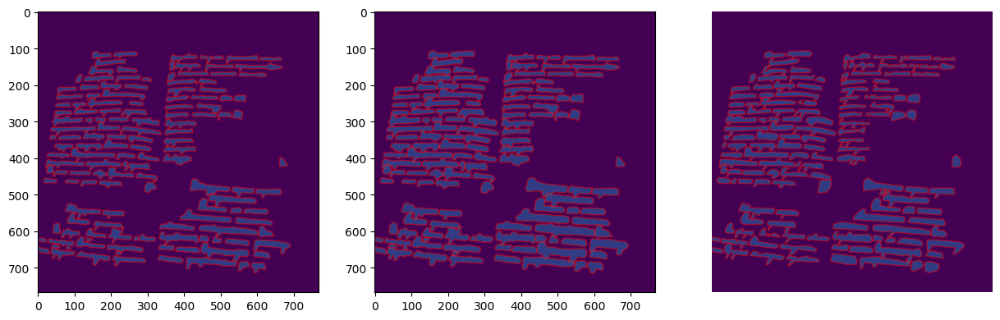

 20%|██        | 8/40 [02:19<09:20, 17.50s/it]

Execution time of calc_mAPIoU: 7.33581805229187 seconds
tpmAPIoU_05=0.8770554161511608


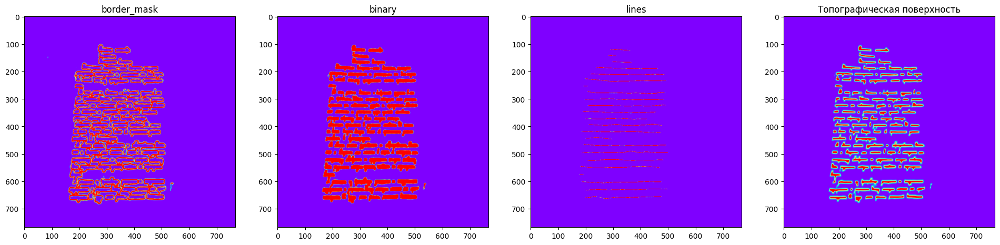

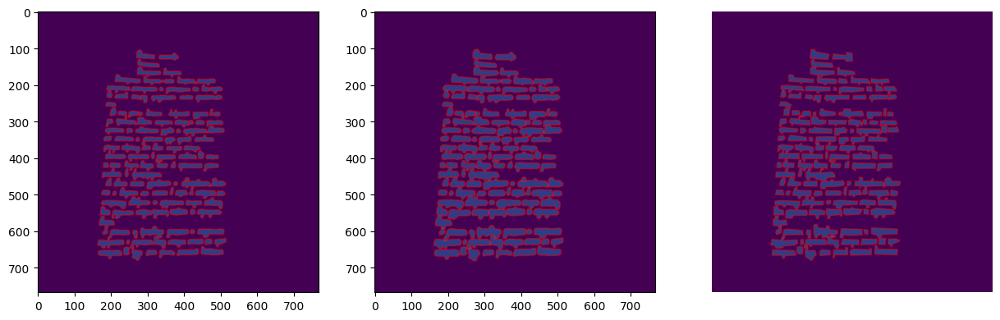

 22%|██▎       | 9/40 [02:33<08:33, 16.57s/it]

Execution time of calc_mAPIoU: 4.833801984786987 seconds
tpmAPIoU_05=0.8354997060177188


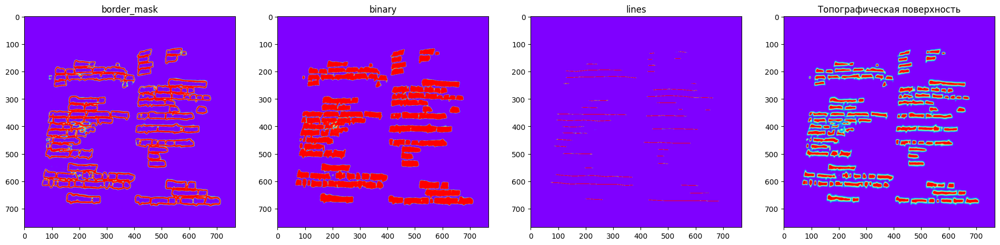

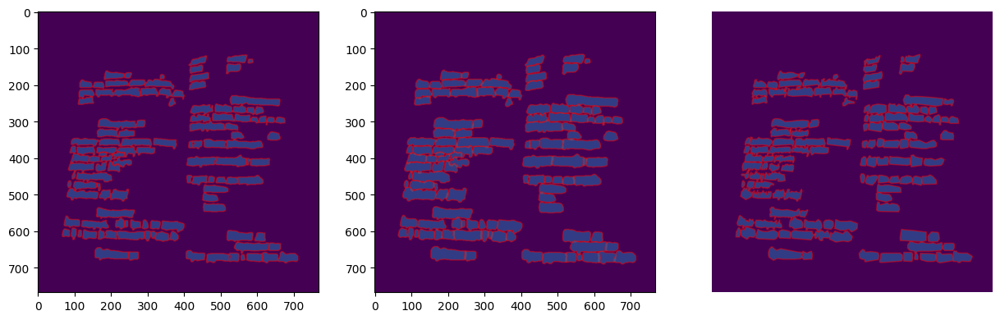

 25%|██▌       | 10/40 [02:47<07:51, 15.73s/it]

Execution time of calc_mAPIoU: 4.906664848327637 seconds
tpmAPIoU_05=0.7186413466410687


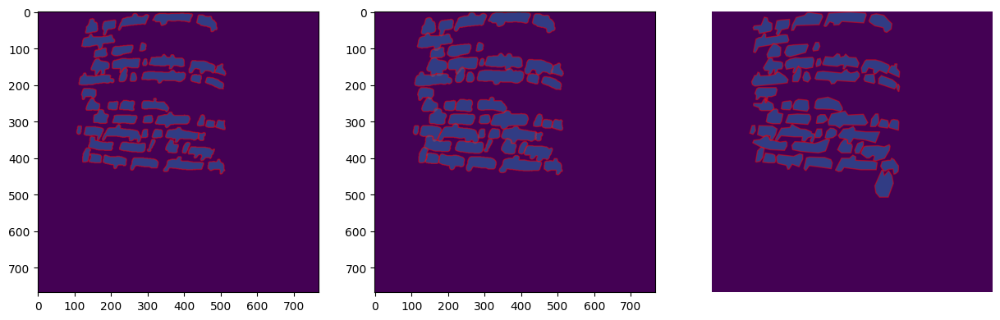

 28%|██▊       | 11/40 [02:58<06:54, 14.28s/it]

Execution time of calc_mAPIoU: 3.8170948028564453 seconds
tpmAPIoU_05=0.8752062732188255


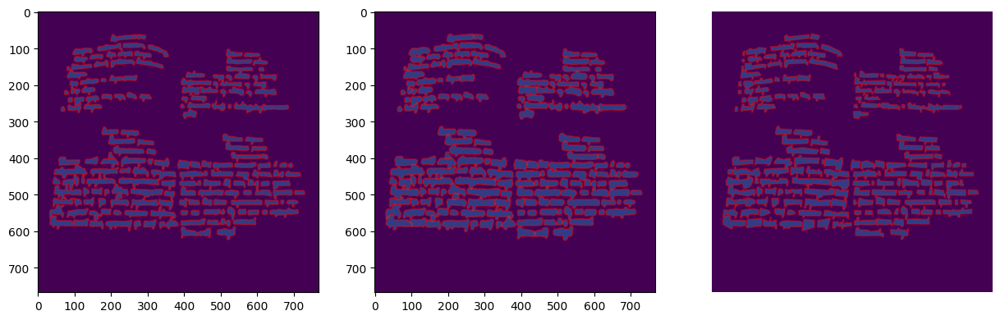

 30%|███       | 12/40 [03:21<07:55, 16.98s/it]

Execution time of calc_mAPIoU: 9.16476035118103 seconds
tpmAPIoU_05=0.805786692356439


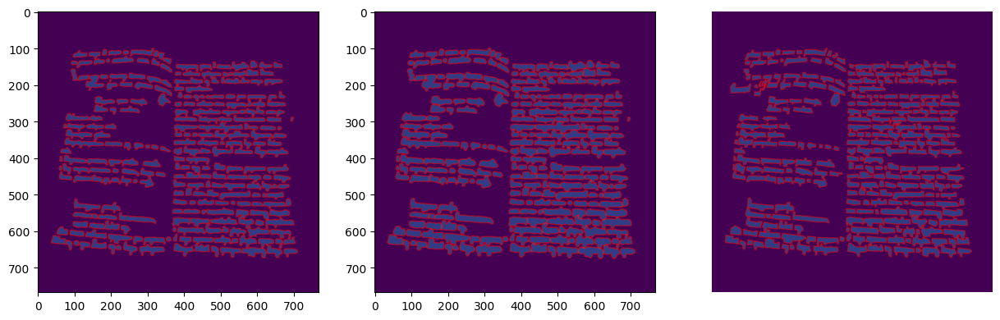

 32%|███▎      | 13/40 [03:44<08:28, 18.83s/it]

Execution time of calc_mAPIoU: 9.31570053100586 seconds
tpmAPIoU_05=0.8479408051099228


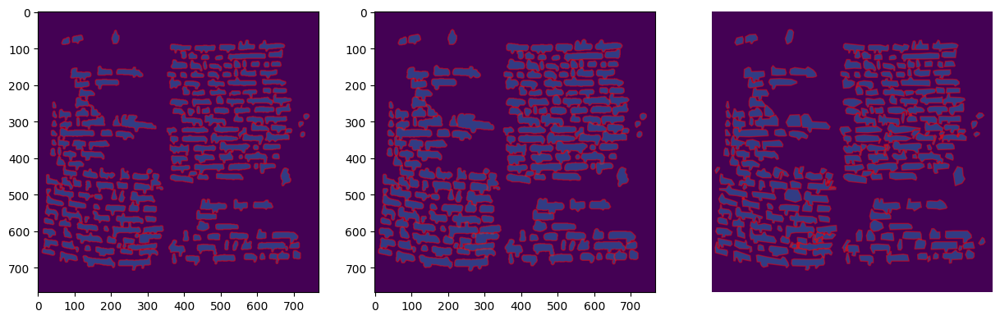

 35%|███▌      | 14/40 [04:01<07:53, 18.22s/it]

Execution time of calc_mAPIoU: 6.490867614746094 seconds
tpmAPIoU_05=0.7503742438161589


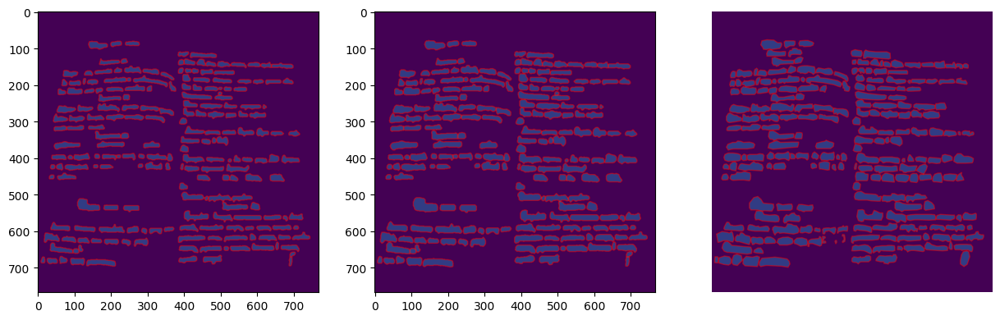

 38%|███▊      | 15/40 [04:23<08:03, 19.34s/it]

Execution time of calc_mAPIoU: 8.802361249923706 seconds
tpmAPIoU_05=0.8659957501716504


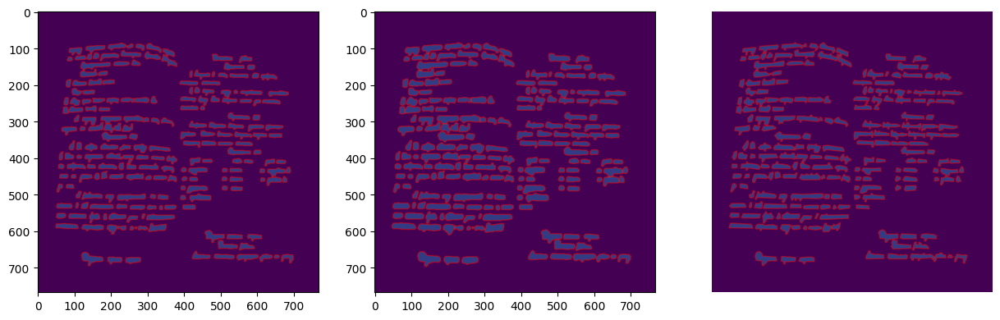

 40%|████      | 16/40 [04:44<07:53, 19.71s/it]

Execution time of calc_mAPIoU: 8.337622880935669 seconds
tpmAPIoU_05=0.8494784631688015


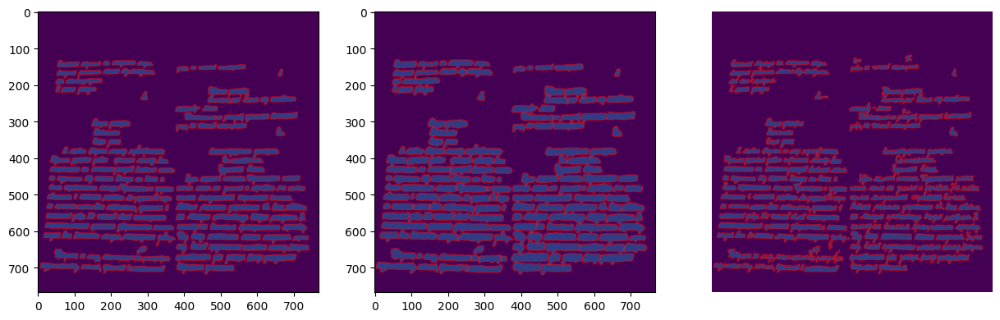

 42%|████▎     | 17/40 [04:57<06:49, 17.82s/it]

Execution time of calc_mAPIoU: 4.929141998291016 seconds
tpmAPIoU_05=0.8088503476281363


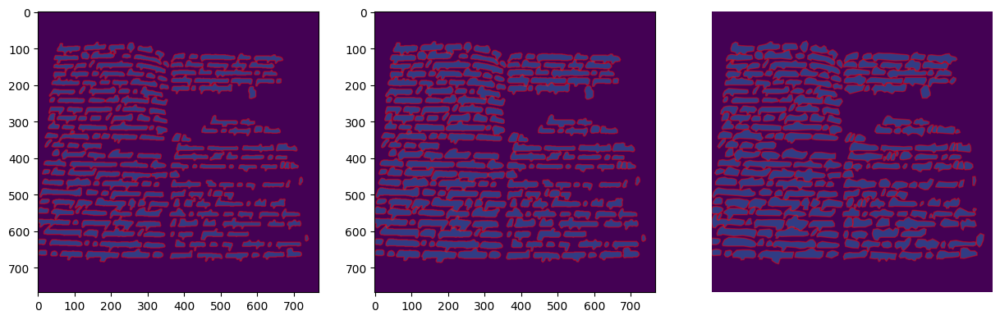

 45%|████▌     | 18/40 [05:14<06:22, 17.39s/it]

Execution time of calc_mAPIoU: 5.799579620361328 seconds
tpmAPIoU_05=0.83013676930804


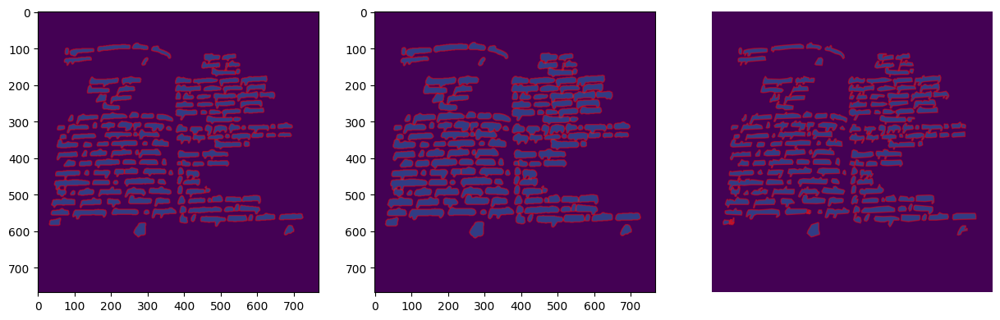

 48%|████▊     | 19/40 [05:37<06:42, 19.16s/it]

Execution time of calc_mAPIoU: 9.660818576812744 seconds
tpmAPIoU_05=0.9134443504148896


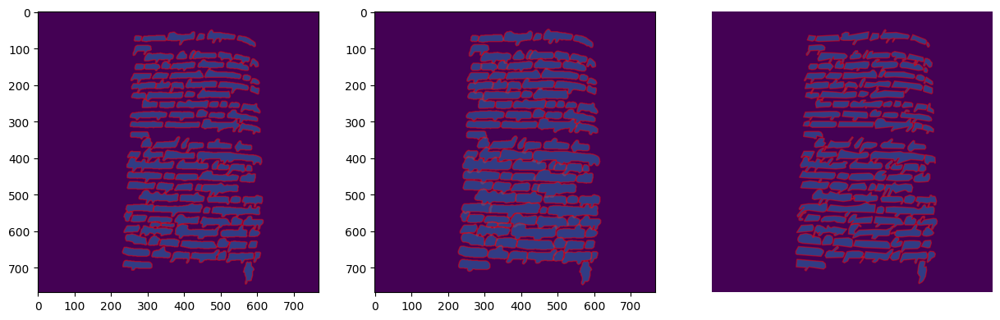

 50%|█████     | 20/40 [05:52<05:56, 17.85s/it]

Execution time of calc_mAPIoU: 5.449594497680664 seconds
tpmAPIoU_05=0.7335995368346293


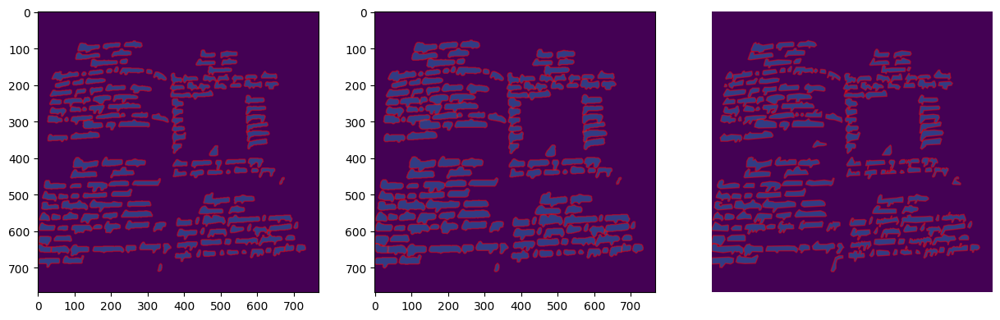

 52%|█████▎    | 21/40 [06:03<05:02, 15.92s/it]

Execution time of calc_mAPIoU: 4.301740884780884 seconds
tpmAPIoU_05=0.7542278467789915


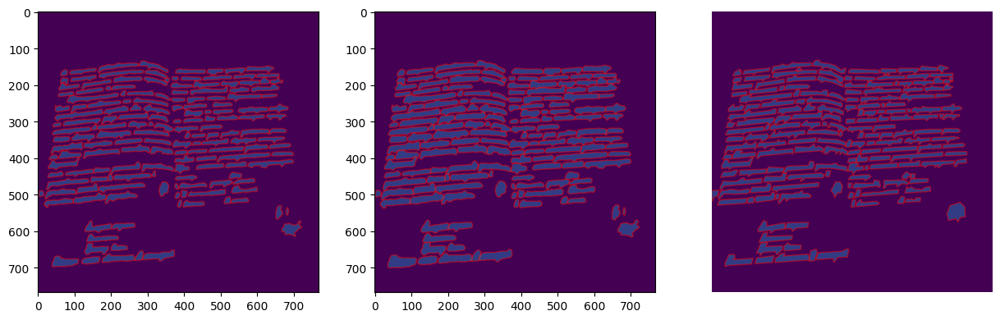

 55%|█████▌    | 22/40 [06:32<05:56, 19.79s/it]

Execution time of calc_mAPIoU: 11.884634494781494 seconds
tpmAPIoU_05=0.8486840828591136


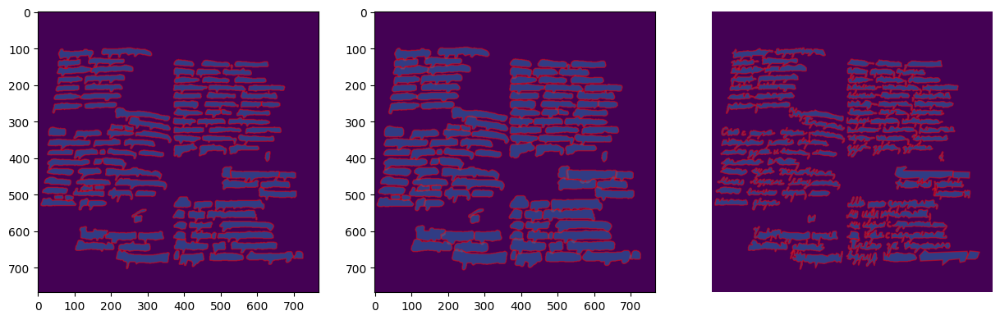

 57%|█████▊    | 23/40 [06:49<05:20, 18.88s/it]

Execution time of calc_mAPIoU: 6.336280584335327 seconds
tpmAPIoU_05=0.8136055276095313


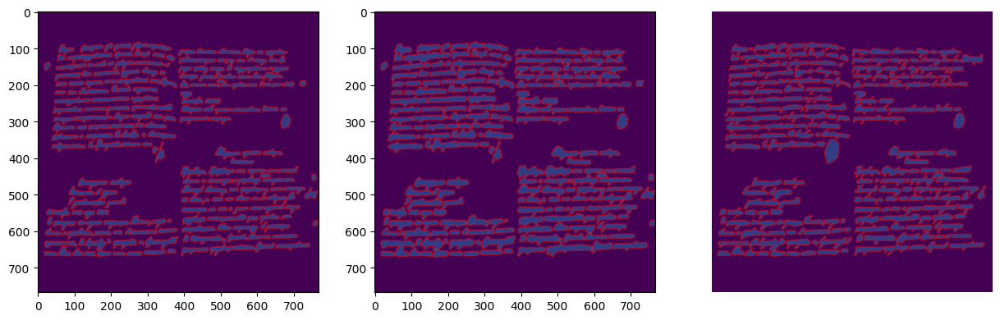

 60%|██████    | 24/40 [07:07<04:57, 18.62s/it]

Execution time of calc_mAPIoU: 7.286936521530151 seconds
tpmAPIoU_05=0.8714775296267621


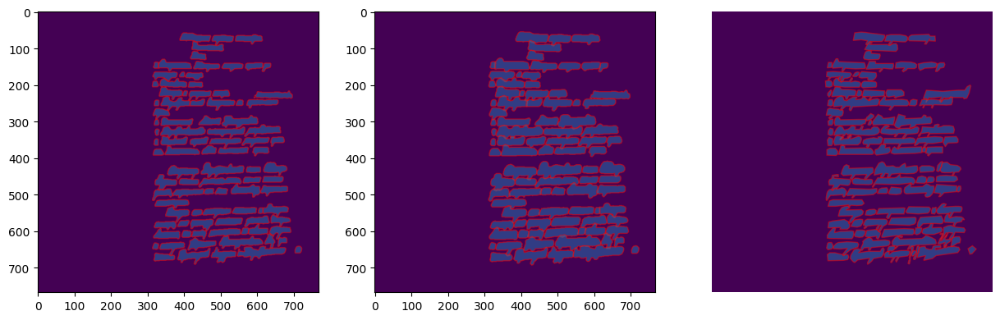

 62%|██████▎   | 25/40 [07:26<04:43, 18.90s/it]

Execution time of calc_mAPIoU: 8.397307634353638 seconds
tpmAPIoU_05=0.8020209399107214


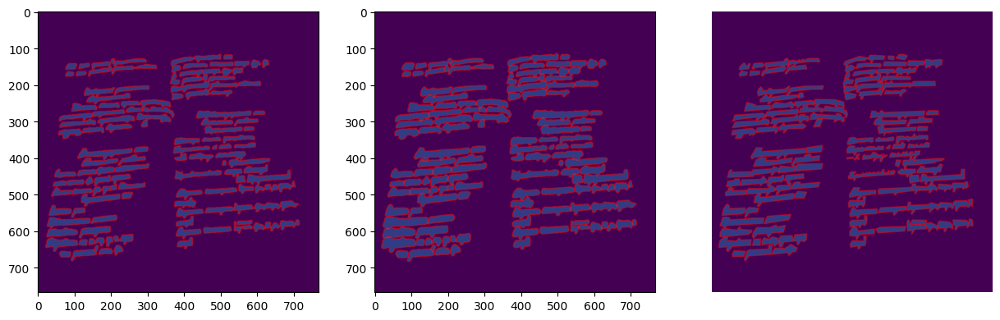

 65%|██████▌   | 26/40 [07:38<03:55, 16.82s/it]

Execution time of calc_mAPIoU: 4.025858640670776 seconds
tpmAPIoU_05=0.6814949389035272


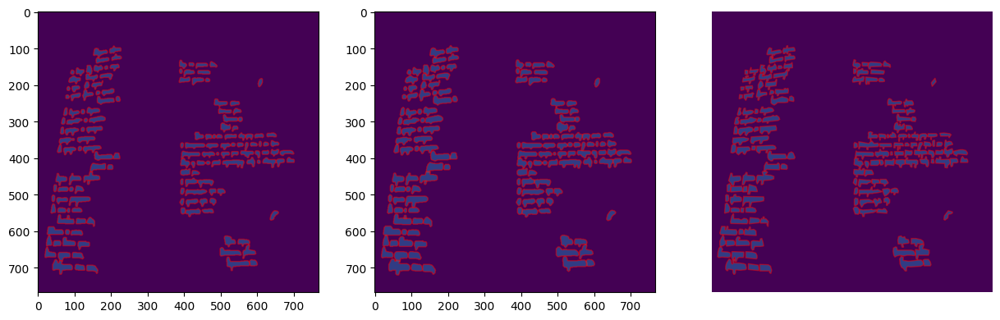

 68%|██████▊   | 27/40 [08:01<04:02, 18.68s/it]

Execution time of calc_mAPIoU: 9.701844453811646 seconds
tpmAPIoU_05=0.8414237153823863


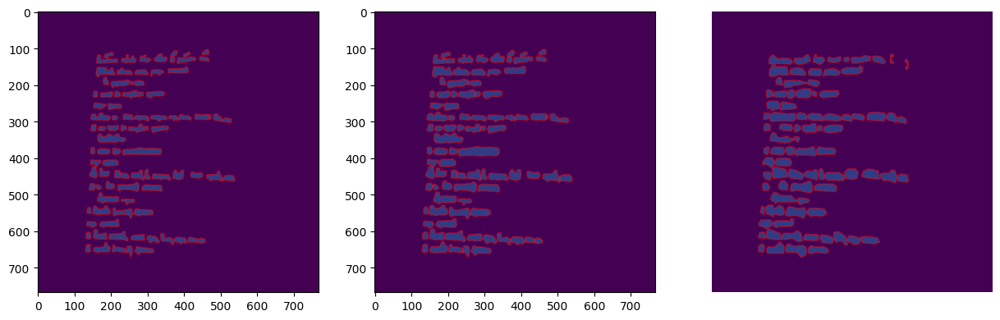

 70%|███████   | 28/40 [08:22<03:51, 19.27s/it]

Execution time of calc_mAPIoU: 8.41976547241211 seconds
tpmAPIoU_05=0.8501208747249817


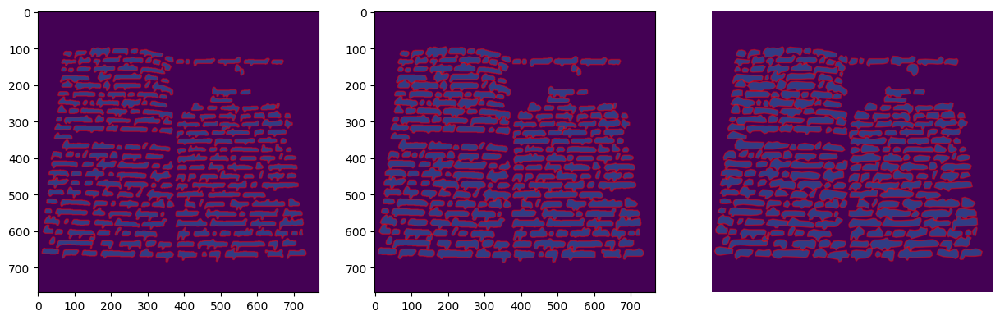

 72%|███████▎  | 29/40 [08:42<03:34, 19.51s/it]

Execution time of calc_mAPIoU: 7.271136045455933 seconds
tpmAPIoU_05=0.8578063772634614


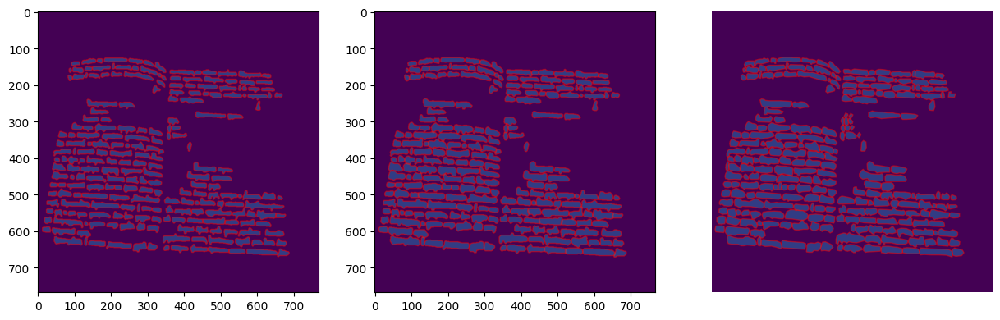

 75%|███████▌  | 30/40 [08:57<03:02, 18.27s/it]

Execution time of calc_mAPIoU: 6.269269943237305 seconds
tpmAPIoU_05=0.8640660939828496


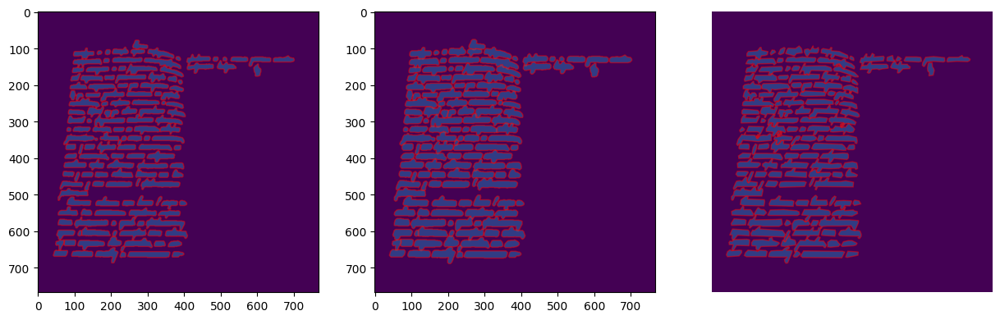

 78%|███████▊  | 31/40 [09:11<02:32, 16.93s/it]

Execution time of calc_mAPIoU: 4.8707616329193115 seconds
tpmAPIoU_05=0.8765137459942655


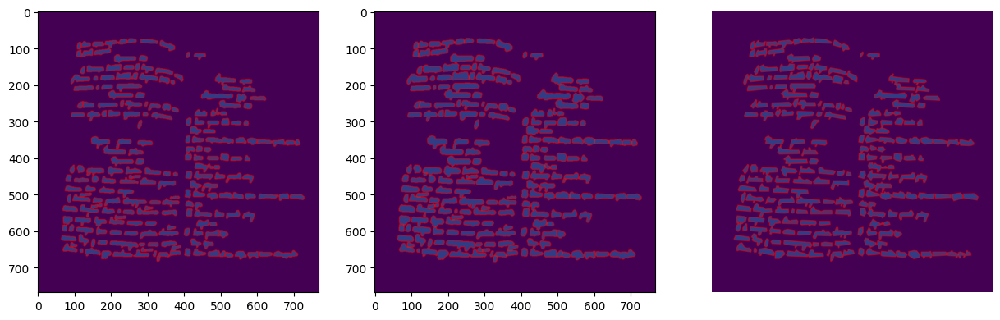

 80%|████████  | 32/40 [09:30<02:21, 17.65s/it]

Execution time of calc_mAPIoU: 8.122161626815796 seconds
tpmAPIoU_05=0.8497135402768459


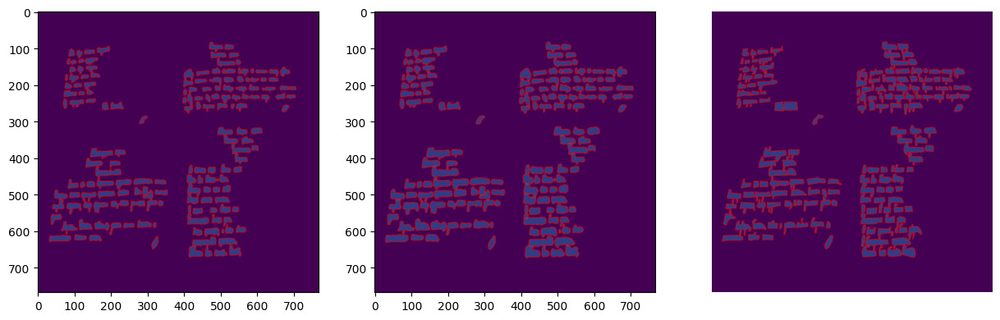

 82%|████████▎ | 33/40 [09:51<02:10, 18.60s/it]

Execution time of calc_mAPIoU: 8.42853832244873 seconds
tpmAPIoU_05=0.8322500824897677


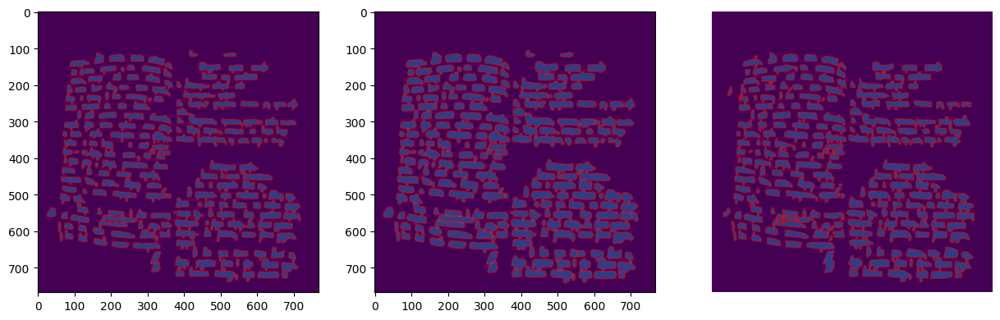

 85%|████████▌ | 34/40 [10:15<02:01, 20.26s/it]

Execution time of calc_mAPIoU: 10.176360607147217 seconds
tpmAPIoU_05=0.8413910140603709


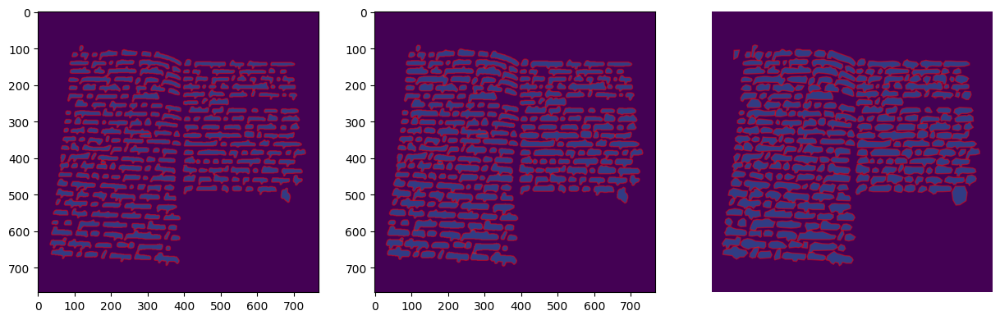

 88%|████████▊ | 35/40 [10:37<01:42, 20.53s/it]

Execution time of calc_mAPIoU: 7.858762741088867 seconds
tpmAPIoU_05=0.7875469544373682


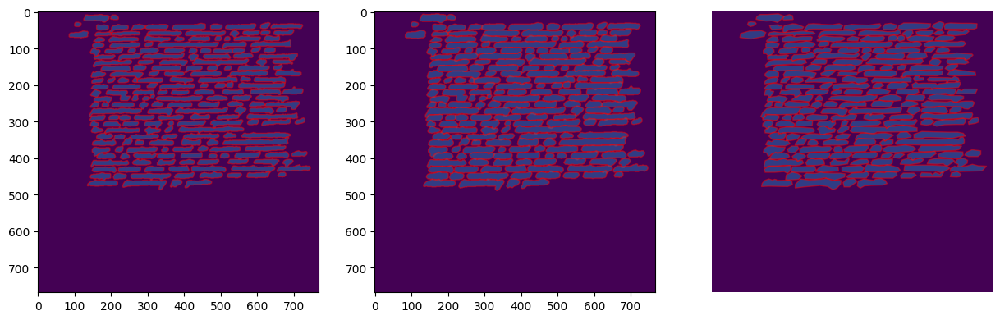

 90%|█████████ | 36/40 [10:55<01:19, 19.99s/it]

Execution time of calc_mAPIoU: 6.528682708740234 seconds
tpmAPIoU_05=0.823548249333425


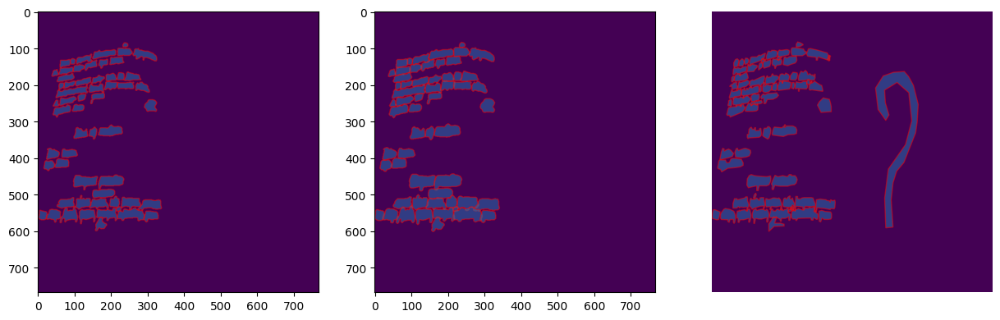

 92%|█████████▎| 37/40 [11:13<00:57, 19.18s/it]

Execution time of calc_mAPIoU: 7.050750970840454 seconds
tpmAPIoU_05=0.7940200580565338


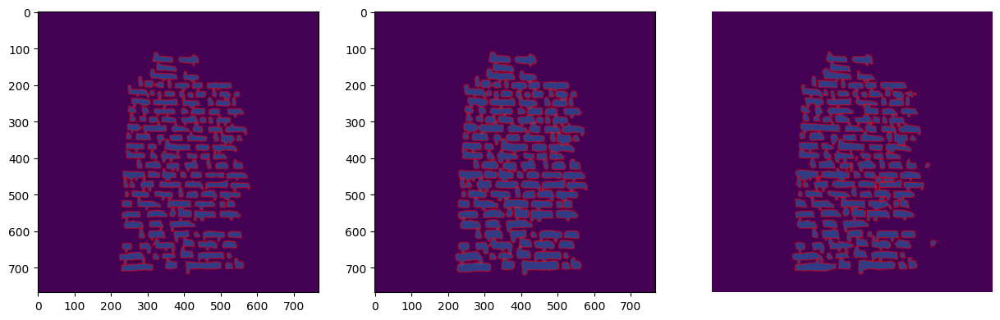

 95%|█████████▌| 38/40 [11:26<00:35, 17.50s/it]

Execution time of calc_mAPIoU: 5.046173095703125 seconds
tpmAPIoU_05=0.8459939128439877


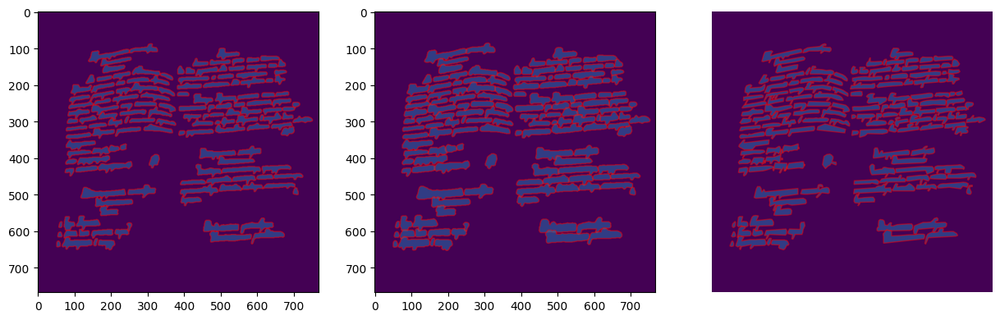

 98%|█████████▊| 39/40 [11:42<00:16, 16.94s/it]

Execution time of calc_mAPIoU: 6.497820138931274 seconds
tpmAPIoU_05=0.7546161083931425


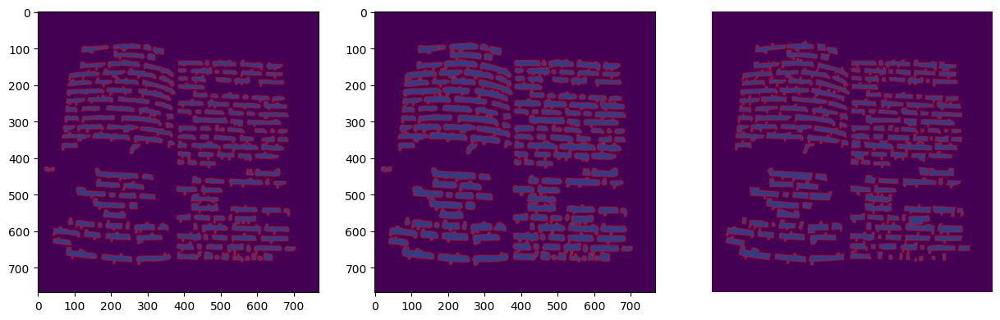

100%|██████████| 40/40 [11:58<00:00, 17.97s/it]

Execution time of calc_mAPIoU: 6.228851556777954 seconds
tpmAPIoU_05=0.870652158878359
LOSS test 0.13414606393316048

Loss: 0.134 | IoU-pi: 0.635 | Acc-pi: 0.973 | Precision-pi: 0.709 | Recall-pi: 0.829 | F1-pi: 0.760 | mAPIoU-poly: 0.823 | Precision-poly: 0.908 | Recall-poly: 0.894 | F1-poly: 0.899


In [95]:
from src.segmentation.metrics import *
from src.segmentation.predictor import *

from tqdm import tqdm
from src.segmentation.utils import dict_to

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

pretrained_model.eval()

# Disable gradient computation and reduce memory consumption.
loader_len = len(testing_loader)
with torch.no_grad():
    
    metric_monitor = MetricMonitor()
    
    for i, vdata in tqdm(enumerate(testing_loader), total=loader_len):
#         if i == 1: break

        vinputs, vlabels = vdata[0].to(device), dict_to(vdata[1], device)

        vinputs = vinputs.float()
        voutputs = pretrained_model(vinputs)

        tloss = loss_fn(voutputs, vlabels)
        
        metric_monitor.update('Loss', tloss)

        if i < 10:
            fig = plt.figure(figsize=(30, 60))

            ax1 = fig.add_subplot(1, 5, 1)
            ax1.set_title('border_mask')
            ax1.imshow(colorize(voutputs['border_mask'][0].data.cpu().numpy()[0]))

            ax2 = fig.add_subplot(1, 5, 2)
            ax2.set_title('binary')
            ax2.imshow(colorize(voutputs['binary'][0].data.cpu().numpy()[0]))

            ax3 = fig.add_subplot(1, 5, 3)
            ax3.set_title('lines')
            ax3.imshow(colorize(voutputs['lines'][0].data.cpu().numpy()[0]))

            ax4 = fig.add_subplot(1, 5, 4)
            ax4.set_title('Топографическая поверхность')
            ax4.imshow(colorize(calculate_energy(voutputs['watershed'][0])[1]))

#             original = np.transpose(vinputs[0].data.cpu().numpy(), (1, 2, 0))
#             ax5 = fig.add_subplot(1,5,5)
#             ax5.set_title('Исходное изображение')
#             ax5.imshow(original)

            plt.show()

#             result = voutputs['binary'][0].data.cpu().numpy()[0] - voutputs['border_mask'][0].data.cpu().numpy()[0]
#             plt.imshow(colorize(result))
#             plt.show()

#         voutputs['binary'] = voutputs['binary'] - voutputs['border_mask']

        binary_tiou = batch_mean(voutputs['binary'], vlabels['binary'], iou_pytorch)
        binary_tf1_score = batch_mean(voutputs['binary'], vlabels['binary'], f1_score)
        binary_tacc = batch_mean(voutputs['binary'], vlabels['binary'], accuracy)
        binary_tp = batch_mean(voutputs['binary'], vlabels['binary'], precision)
        binary_tr = batch_mean(voutputs['binary'], vlabels['binary'], recall)

        lines_tiou = batch_mean(voutputs['lines'], vlabels['lines'], iou_pytorch)
        lines_tf1_score = batch_mean(voutputs['lines'], vlabels['lines'], f1_score)
        lines_tacc = batch_mean(voutputs['lines'], vlabels['lines'], accuracy)
        lines_tp = batch_mean(voutputs['lines'], vlabels['lines'], precision)
        lines_tr = batch_mean(voutputs['lines'], vlabels['lines'], recall)

        tiou = (binary_tiou + lines_tiou) / 2
        tf1 = (binary_tf1_score + lines_tf1_score) / 2
        tacc = (binary_tacc + lines_tacc) / 2
        tr = (binary_tr + lines_tr) / 2
        tp = (binary_tp + lines_tp) / 2
        
        metric_monitor.update('IoU-pi', tiou)
        metric_monitor.update('Acc-pi', tacc)
        metric_monitor.update('Precision-pi', tp)
        metric_monitor.update('Recall-pi', tr)
        metric_monitor.update('F1-pi', tf1)

        pred_data = get_watershed_predictions(vinputs, voutputs)  # batch size list of predictions

        def get_polygons(batch_pred, class_name):
            return [pred['polygon']
                    for pred in batch_pred['predictions']
                    if pred['class_name'] == class_name]

        predicted_word_polygons = list(map(
            lambda batch_pred: get_polygons(batch_pred, 'handwritten_text'), pred_data))

        predicted_line_polygons = list(map(
            lambda batch_pred: get_polygons(batch_pred, 'lines'), pred_data))

        
        # Draw and compare polygons  

        image = np.zeros((target_h, target_w), dtype=np.uint8)

        fig = plt.figure(figsize=(15, 45))
        ax1 = fig.add_subplot(1, 3, 1)
        ax2 = fig.add_subplot(1, 3, 2)

        for polygon in predicted_word_polygons[0]:
            from shapely.geometry import Polygon

            if len(polygon) == 0: continue

            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax1.add_patch(poly)

            upscaled_polygon = upscale_contour(polygon, upscale_ratio)
            upscaled_poly = patches.Polygon(upscaled_polygon, closed=True, edgecolor='r', alpha=0.5)
            ax2.add_patch(upscaled_poly)

        ax1.imshow(image)
        ax2.imshow(image)

        ax3 = fig.add_subplot(1, 3, 3)
        for polygon in vlabels['word_polygons'][0]:
            from shapely.geometry import Polygon

            if len(polygon) == 0: continue
            poly = patches.Polygon(polygon, closed=True, edgecolor='r', alpha=0.5)
            ax3.add_patch(poly)
        ax3.imshow(image)

        plt.axis('off')
        plt.show()

#         original = np.transpose(vinputs[0].cpu().numpy(), (1, 2, 0))
#         plt.imshow((original * 255).astype(np.uint8))
#         plt.show()

        tpmAPIoU_05, tpp, tpr, tpf1 = calc_mAPIoU(
            predicted_word_polygons, vlabels['word_polygons'], upscale_ratio=upscale_ratio)

        print(f"{tpmAPIoU_05=}")
        
        metric_monitor.update('mAPIoU-poly', tpmAPIoU_05)
        metric_monitor.update('Precision-poly', tpp)
        metric_monitor.update('Recall-poly', tpr)
        metric_monitor.update('F1-poly', tpf1)

avg_tloss = metric_monitor.get('Loss')
print('LOSS test {}'.format(avg_tloss))

print(f"\n{metric_monitor}")

In [42]:
testing_set_en.save_df()
testing_set_ru.save_df()

# Logging

In [ ]:
!wget https://bin.equinox.io/c/bNyj1mQVY4c/ngrok-v3-stable-linux-amd64.tgz
!tar xvzf ngrok-v3-stable-linux-amd64.tgz
!./ngrok authtoken 2NBUsTahExidrnNKiX1F9mEcqfM_23YXKFajCBgcH6tSJHYks

In [ ]:
import os
import multiprocessing

pool = multiprocessing.Pool(processes=10)
results_of_processes = [pool.apply_async(os.system, args=(cmd,), callback=None)
                        for cmd in [
                            f"tensorboard --logdir ./runs/ --host 0.0.0.0 --port 6006 &",
                            "./ngrok http 6006 &"
                        ]]

In [ ]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
"import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

# Convert model to onnx format

In [87]:
!pip install onnxruntime onnx > /dev/null

In [119]:
model_name = 'linknet_12_2.onnx'
model_path = f'{parentdir}/{model_name}'
model_path

'/kaggle/working/linknet_12_2.onnx'

In [120]:
# Input to the model
x = torch.randn(2, 3, target_h, target_w, requires_grad=True).to(device)
torch_out = pretrained_model(x)

In [121]:
# Export the model
torch.onnx.export(pretrained_model,  # model being run
                  x,  # model input (or a tuple for multiple inputs)
                  model_path,  # where to save the model (can be a file or file-like object)
                  export_params=True,  # store the trained parameter weights inside the model file
                  opset_version=10,  # the ONNX version to export the model to
                  do_constant_folding=True,  # whether to execute constant folding for optimization
                  input_names=['input'],  # the model's input names
                  output_names=['output'],  # the model's output names
                  dynamic_axes={'input': {0: 'batch_size'},  # variable length axes
                                'output': {0: 'batch_size'}})

In [122]:
%cd {parentdir}

/kaggle/working


In [123]:
from IPython.display import FileLink

FileLink(f'{model_name}')

/kaggle/working/linknet_12_2.onnx

In [125]:
%cd {workdir}

/kaggle/working/rhtr


In [126]:
import onnxruntime

ort_session = onnxruntime.InferenceSession(model_path)

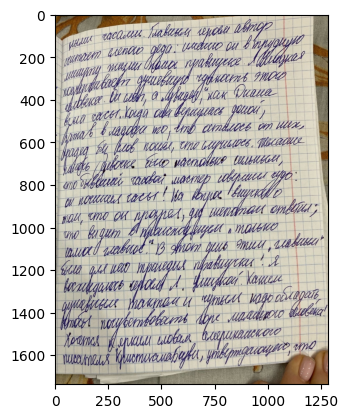

In [155]:
image = cv2.imread('/kaggle/input/handwritten-text-images/handwritten_text_images/5.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

len(output)=4
output[0].shape=(1, 1, 768, 768)
output[1].shape=(1, 1, 768, 768)
output[2].shape=(1, 1, 768, 768)
output[3].shape=(1, 10, 768, 768)


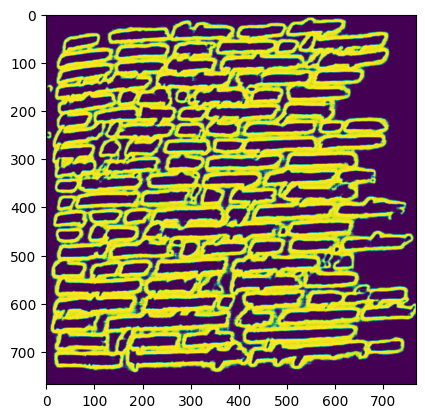

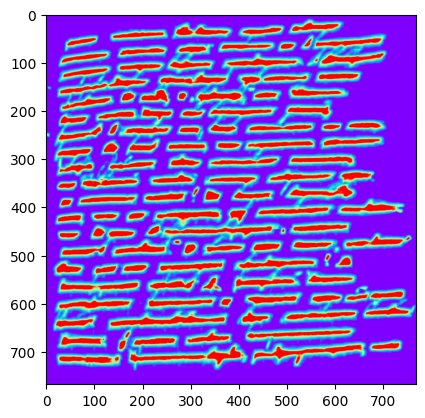

In [156]:
import torchvision
import os
from src.segmentation.predictor import calculate_energy
from src.segmentation.utils import colorize

import matplotlib.pyplot as plt

outputs = []

train_transform = A.Compose([
    A.Resize(width=target_w, height=target_h),
    A.Normalize(mean=ADE_MEAN, std=ADE_STD),
])

for image in [image]:
    transformed_image = preprocessing(image)
    transformed_image = train_transform(image=image)['image']
    transformed_image = torchvision.transforms.ToTensor()(transformed_image)
    transformed_image = transformed_image[None, :, :, :]

    output = ort_session.run(None, {'input': transformed_image.numpy()})

    print(f"{len(output)=}")
    print(f"{output[0].shape=}")
    print(f"{output[1].shape=}")
    print(f"{output[2].shape=}")
    print(f"{output[3].shape=}")
    
    plt.imshow(output[2][0][0])
    plt.show()
    
    plt.imshow(colorize(np.mean(output[3][0], axis=0)))
    plt.show()